In [220]:
import numpy as np
import os
import math
import pandas as pd
from collections import Counter
import itertools

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

%matplotlib inline

In [42]:
def load_from_directory(directory, target_names, max_files_in_one_category=30000):
    file_texts = []
    targets = []
    
    for root, dirs, files in os.walk(directory):
        number_used_files = 0
        for name in files:
            if number_used_files < max_files_in_one_category:
                file_path = os.path.join(root, name)
                try:
                    with open(file_path) as file:
                
                        # считываем файл построчно
                        file_text = ""
                        for line in file.readlines():
                            #l = line.split('\n')[0]
                            #file_text += (str(l.split(' ')[-1]) + " ")
                            file_text += (line + " ")
                        if file_text != "" and file_text != " ":
                            file_texts.append(file_text)
                
                            _, cur_target = os.path.split(root)
                            cur_target = target_names.index(cur_target)
                            targets.append(cur_target)
                
                            number_used_files += 1            
                except:
                    print("PROBLEM WITH FILE", file_path)
            
    return file_texts, targets

In [63]:
%%time
file_texts, y = load_from_directory("D:/svruchtel/DATA/USA_Small", 
                                         ["Airfare", "CarRental", "GeneralRetail", "Hotel", "Other", "Parking", "Restaurant",
                                         "Taxi", "Transport"],
                                         10)

PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Other\0000002.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Other\0000005.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Other\0000006.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Taxi\0000013.txt
Wall time: 36.1 ms


In [64]:
print(len(file_texts))
print(len(y))

84
84


In [65]:
np.array(y)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8])

In [61]:
#file_texts[82]

In [59]:
# tfidf matrix for all texts
vectorizer = TfidfVectorizer(max_df=0.8, max_features=200,
                                 min_df=0.01, stop_words='english',
                                 use_idf=True)
X = vectorizer.fit_transform(file_texts)

In [74]:
X.shape

(84, 200)

In [88]:
p = np.random.permutation(len(y))
print(p)

[ 9 77 46 26 57 49 72 76 14 62 56 10 31 43 74 30 20 63 59 61 21  4 78 83
 12 53 25 17 73 69 38 29  7 81 27 22 35 19 79 80 37 23 15 42 18 33 71 41
 60 32 45 51 67  6 44 65 39 34 13 11 70 28 54  3 64 68  5  2 55  0 48 36
 75 58 82 40  1 50  8 24 66 47 16 52]


In [205]:
def divide_to_train_and_test(X, y, num_categories, part_to_test=0.1):

    # In X and y firstly should be elements form catefory 0, than elements from catefory 1 etc
    
    y_train = []
    y_test = []
    indices_to_X_train = []
    indices_to_X_test = []
    
    elem_idx = 0
    counter = Counter(y)
    
    for category_id in range(num_categories):
        # count of elements in category <category_id>
        category_elems_count = counter[category_id] 
        test_elements_count = math.ceil(category_elems_count * part_to_test)
        train_elements_count = category_elems_count - test_elements_count
        
        for categories_elem_idx in range(category_elems_count):
            if train_elements_count > 0:
                indices_to_X_train.append(elem_idx)
                y_train.append(y[elem_idx])
                train_elements_count -= 1
            else:
                indices_to_X_test.append(elem_idx)
                y_test.append(y[elem_idx])
            elem_idx += 1
        
    return X[indices_to_X_train], np.array(y_train), X[indices_to_X_test], np.array(y_test)

In [146]:
len(y)

84

In [147]:
X_train, y_train, X_test, y_test = divide_to_train_and_test(X, y, 9)

In [148]:
y_train

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       8, 8, 8, 8, 8, 8, 8, 8, 8])

In [149]:
y_test

array([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [164]:
clf = SVC()
clf.fit(X_train, y_train)
cr = classification_report(y_test, clf.predict(X_test))
print(cr)
acc = accuracy_score(y_test, clf.predict(X_test))
print("accuracy:", acc)

             precision    recall  f1-score   support

          0       0.50      1.00      0.67         1
          1       0.00      0.00      0.00         1
          2       0.00      0.00      0.00         1
          3       1.00      1.00      1.00         1
          4       0.33      1.00      0.50         1
          5       0.00      0.00      0.00         1
          6       0.00      0.00      0.00         1
          7       1.00      1.00      1.00         1
          8       0.00      0.00      0.00         1

avg / total       0.31      0.44      0.35         9

accuracy: 0.4444444444444444


C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [189]:
metrics_avg = cr[cr.find("avg"):].split('      ')
print(metrics_avg)

['avg / total', ' 0.31', '0.44', '0.35', '   9\n']


In [194]:
precision_avg = metrics_avg[1]
recall_avg = metrics_avg[2]
f1_avg = metrics_avg[3]
print(precision_avg, recall_avg, f1_avg)

 0.31 0.44 0.35


In [206]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [210]:
def print_confusion_matrix(X, y, categories_count):

    #categories_count = 9
    y_pred = clf.predict(X)
    cnf_matrix = confusion_matrix(y, y_pred)

    # Plot non-normalized confusion matrix
    plt.figure()
    plot_confusion_matrix(cnf_matrix, classes=range(categories_count),
                      title='Confusion matrix, without normalization')

    # Plot normalized confusion matrix
    plt.figure()
    plot_confusion_matrix(cnf_matrix, classes=range(categories_count), normalize=True,
                      title='Normalized confusion matrix')

    plt.show()

TRAIN CONFUSION MATRIX
Confusion matrix, without normalization
[[8 0 0 0 1 0 0 0 0]
 [2 6 1 0 0 0 0 0 0]
 [0 0 9 0 0 0 0 0 0]
 [0 0 0 9 0 0 0 0 0]
 [0 0 1 0 8 0 0 0 0]
 [0 0 1 1 0 0 0 1 0]
 [0 0 0 0 0 0 9 0 0]
 [0 0 4 0 0 0 0 5 0]
 [1 1 0 0 0 0 0 0 7]]
Normalized confusion matrix
[[0.88888889 0.         0.         0.         0.11111111 0.
  0.         0.         0.        ]
 [0.22222222 0.66666667 0.11111111 0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.11111111 0.         0.88888889 0.
  0.         0.         0.        ]
 [0.         0.         0.33333333 0.33333333 0.         0.
  0.         0.33333333 0.        ]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.        ]
 [0.         0.         0.44444444 0.         0

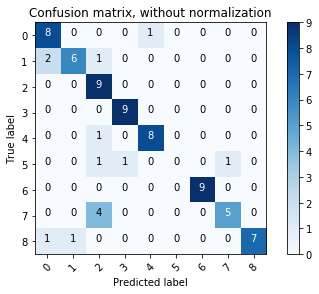

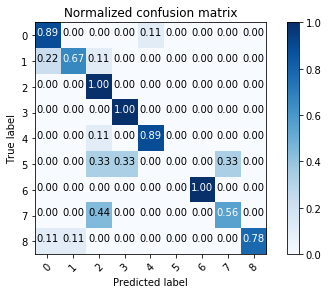

In [212]:
print("TRAIN CONFUSION MATRIX")
print_confusion_matrix(X_train, y_train, 9)

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0 0]
 [0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0]
 [0 0 1 0 0 0 0 0 0]]
Normalized confusion matrix
[[1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0.]]


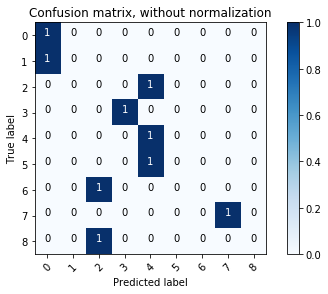

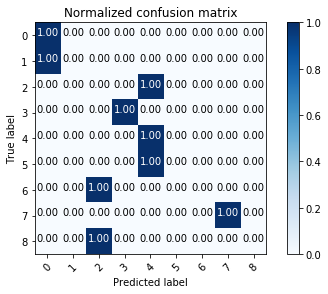

In [213]:
print("TEST CONFUSION MATRIX")
print_confusion_matrix(X_test, y_test, 9)

In [224]:
# Create two pandas tables
# One with parameters, and one - with results

parameters_df = pd.DataFrame(columns=['dataset_name', 'C', 'kernel', 'degree', 'train_or_test', 'max_elements_in_category'])
results_df = pd.DataFrame(columns=['dataset_name', 'train_or_test',
                                   'accuracy', 'precision', 'recall', 'fmeasure'])


In [231]:
def run_classification_and_write_results(X_train, y_train, X_test, y_test, parameters_df, results_df,
                                         categories_count, max_elements_in_category,
                                         C=1.0, kernel='rbf', degree=3):
    
    clf = SVC(C=C, kernel=kernel, degree=degree)
    clf.fit(X_train, y_train)
    
    cr_train = classification_report(y_train, clf.predict(X_train))
    print(cr_train)
    acc_train = accuracy_score(y_train, clf.predict(X_train))
    print("accuracy:", acc_train)
    
    metrics_avg_train = cr_train[cr_train.find("avg"):].split('      ')
    precision_avg_train = metrics_avg_train[1]
    recall_avg_train = metrics_avg_train[2]
    f1_avg_train = metrics_avg_train[3]
    print(precision_avg_train, recall_avg_train, f1_avg_train)
    
    cr_test = classification_report(y_test, clf.predict(X_test))
    print(cr_test)
    acc_test = accuracy_score(y_test, clf.predict(X_test))
    print("accuracy:", acc_test)
    
    metrics_avg_test = cr_test[cr_test.find("avg"):].split('      ')
    precision_avg_test = metrics_avg_test[1]
    recall_avg_test = metrics_avg_test[2]
    f1_avg_test = metrics_avg_test[3]
    print(precision_avg_test, recall_avg_test, f1_avg_test)
    
    print("TRAIN CONFUSION MATRIX")
    print_confusion_matrix(X_train, y_train, categories_count)
    
    print("TEST CONFUSION MATRIX")
    print_confusion_matrix(X_test, y_test, categories_count)
    
    # write everyting somewere
    parameters = {'dataset_name':'USA_Small', 'C':C, 'kernel':kernel, 'degree':degree, 'train_or_test':'train',
                  'max_elements_in_category':max_elements_in_category}
    parameters_df = parameters_df.append(parameters, ignore_index=True)
    results = {'dataset_name':'USA_Small', 'train_or_test':'train',
               'accuracy':acc_train, 'precision':precision_avg_train,
               'recall':recall_avg_train, 'fmeasure':f1_avg_train}
    results_df = results_df.append(results, ignore_index=True)
    
    # evaluate on test
    parameters = {'dataset_name':'USA_Small', 'C':C, 'kernel':kernel, 'degree':degree, 'train_or_test':'test',
                 'max_elements_in_category':max_elements_in_category}
    parameters_df = parameters_df.append(parameters, ignore_index=True)
    results = {'dataset_name':'USA_Small', 'train_or_test':'test',
               'accuracy':acc_test, 'precision':precision_avg_test,
               'recall':recall_avg_test, 'fmeasure':f1_avg_test}
    results_df = results_df.append(results, ignore_index=True)
    
    parameters_df.to_csv('./PARAMETERS_AND_RESULTS/SVM__30_04_params_USA_Small.csv', sep='\t')
    results_df.to_csv('./PARAMETERS_AND_RESULTS/SVM__30_04_results_USA_Small.csv', sep='\t')
    
    return parameters_df, results_df
    

In [223]:
#run_classification_and_write_results(X_train, y_train, X_test, y_test, 9)

In [228]:
%%time
# Let's load bigger dataset with no more than 100 elements in each category

file_texts, y = load_from_directory("D:/svruchtel/DATA/USA_Small", 
                                         ["Airfare", "CarRental", "GeneralRetail", "Hotel", "Other", "Parking", "Restaurant",
                                         "Taxi", "Transport"],
                                         100)
# tfidf matrix for all texts
vectorizer = TfidfVectorizer(max_df=0.8, max_features=200,
                                 min_df=0.01, stop_words='english',
                                 use_idf=True)
X = vectorizer.fit_transform(file_texts)

X_train, y_train, X_test, y_test = divide_to_train_and_test(X, y, 9)

PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Airfare\0000079.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Airfare\0000116.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\GeneralRetail\0000147.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\GeneralRetail\0000150.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000081.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000093.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000094.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000095.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000118.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000119.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000120.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000121.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000122.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000123.txt
PROBLEM WITH FILE D:/svruchtel/DATA/USA_Small\Hotel\0000124.txt
PROBLEM WITH FILE D:

C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5       0.00      0.00      0.00        

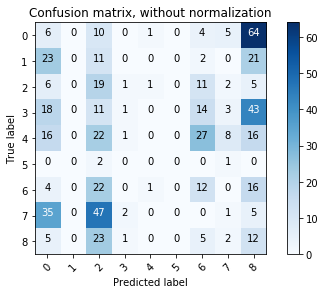

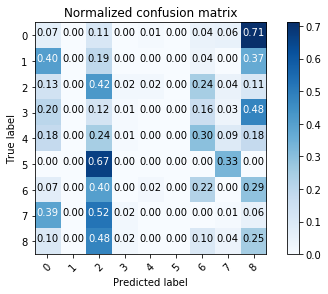

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

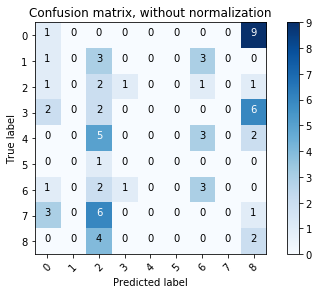

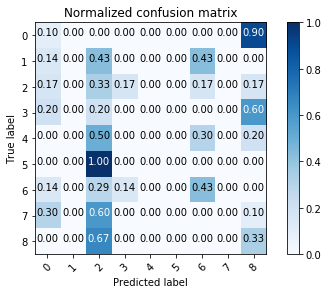

In [233]:
parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100)

C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5       0.00      0.00      0.00        

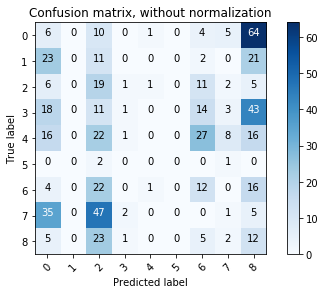

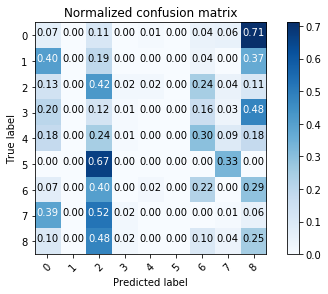

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

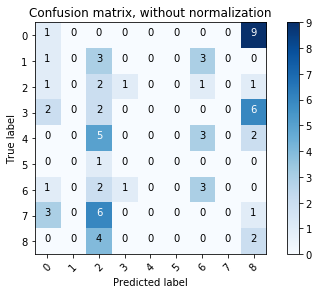

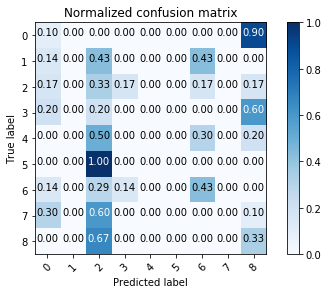

In [234]:
parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=0.2, kernel='rbf', degree=3)

C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.86      0.57      0.68        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.96      0.96      0.96        90
          4       0.31      1.00      0.47        90
          5       0.00      0.00      0.00         3
          6       1.00      0.07      0.14        55
          7       0.91      0.67      0.77        90
          8       0.84      0.33      0.48        48

avg / total       0.75      0.61      0.59       568

accuracy: 0.6056338028169014
 0.75 0.61 0.59
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.24      1.00      0.38        10
          5       0.00      0.00      0.00        

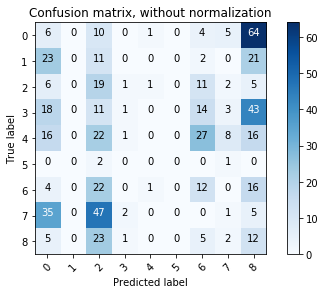

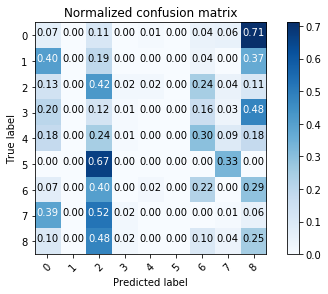

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

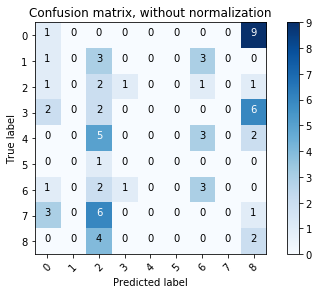

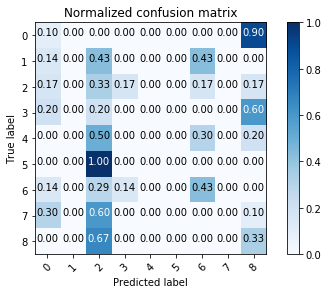

In [235]:
parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=12.5, kernel='rbf', degree=3)

C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5       0.00      0.00      0.00        

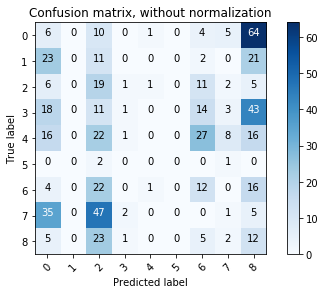

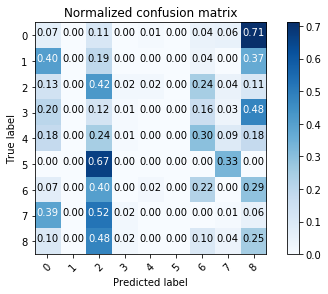

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

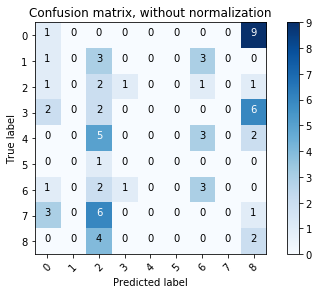

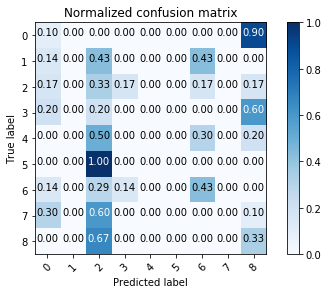

In [236]:
parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=100, kernel='rbf', degree=3)

             precision    recall  f1-score   support

          0       0.96      0.87      0.91        90
          1       0.98      0.84      0.91        57
          2       1.00      0.71      0.83        45
          3       1.00      0.98      0.99        90
          4       0.94      0.90      0.92        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.58      0.98      0.73        90
          8       0.95      0.79      0.86        48

avg / total       0.91      0.87      0.88       568

accuracy: 0.8679577464788732
 0.91 0.87 0.88
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.78      0.70      0.74        10
          5       0.00      0.00      0.00        

C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


accuracy: 0.5970149253731343
 0.62 0.60 0.58
TRAIN CONFUSION MATRIX
Confusion matrix, without normalization
[[ 6  0 10  0  1  0  4  5 64]
 [23  0 11  0  0  0  2  0 21]
 [ 6  0 19  1  1  0 11  2  5]
 [18  0 11  1  0  0 14  3 43]
 [16  0 22  1  0  0 27  8 16]
 [ 0  0  2  0  0  0  0  1  0]
 [ 4  0 22  0  1  0 12  0 16]
 [35  0 47  2  0  0  0  1  5]
 [ 5  0 23  1  0  0  5  2 12]]
Normalized confusion matrix
[[0.06666667 0.         0.11111111 0.         0.01111111 0.
  0.04444444 0.05555556 0.71111111]
 [0.40350877 0.         0.19298246 0.         0.         0.
  0.03508772 0.         0.36842105]
 [0.13333333 0.         0.42222222 0.02222222 0.02222222 0.
  0.24444444 0.04444444 0.11111111]
 [0.2        0.         0.12222222 0.01111111 0.         0.
  0.15555556 0.03333333 0.47777778]
 [0.17777778 0.         0.24444444 0.01111111 0.         0.
  0.3        0.08888889 0.17777778]
 [0.         0.         0.66666667 0.         0.         0.
  0.         0.33333333 0.        ]
 [0.07272727 0.  

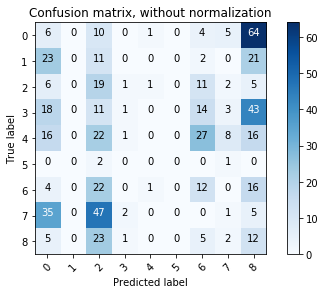

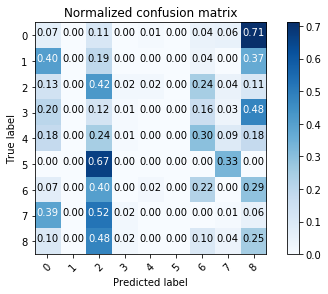

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

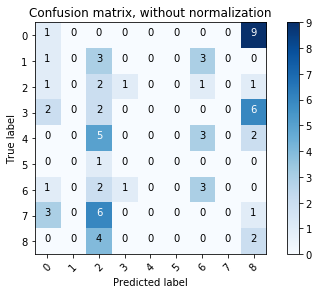

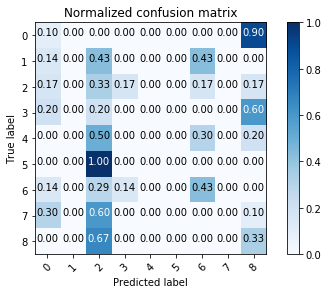

In [237]:
parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=500, kernel='rbf', degree=3)



C = 1.0


C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5       0.00      0.00      0.00        

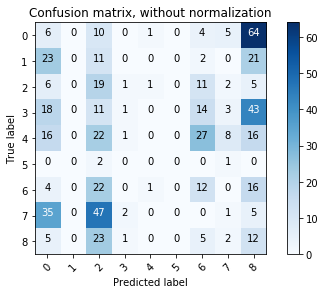

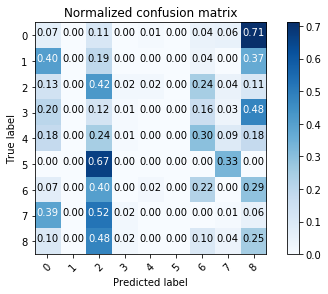

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

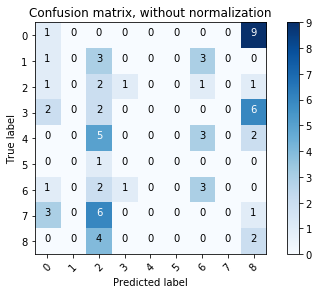

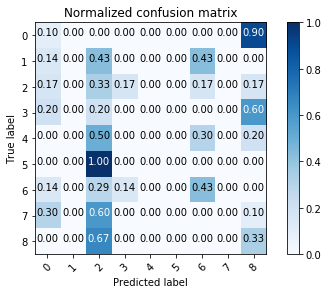



C = 0.2
             precision    recall  f1-score   support

          0       0.86      0.61      0.71        90
          1       0.97      0.65      0.78        57
          2       1.00      0.20      0.33        45
          3       0.96      0.97      0.96        90
          4       0.48      0.90      0.63        90
          5       0.00      0.00      0.00         3
          6       0.95      0.33      0.49        55
          7       0.54      0.97      0.70        90
          8       0.84      0.33      0.48        48

avg / total       0.79      0.69      0.67       568

accuracy: 0.6866197183098591
 0.79 0.69 0.67
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.40      0.80      0.53        10
          5       0.00      0.00      0.

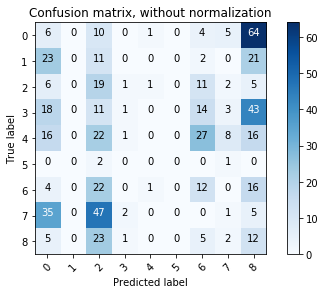

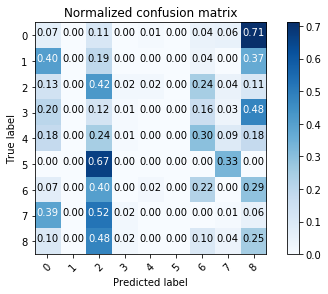

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

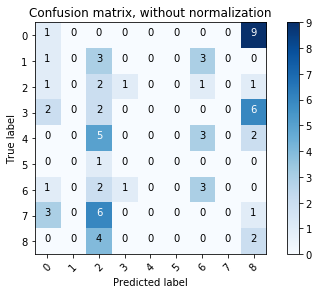

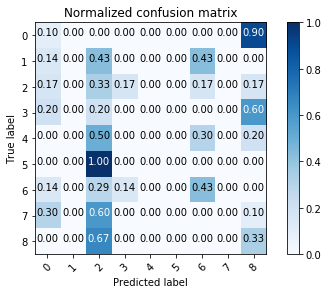



C = 12.5
             precision    recall  f1-score   support

          0       0.99      0.89      0.94        90
          1       0.98      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       0.98      0.85      0.91        48

avg / total       0.92      0.88      0.89       568

accuracy: 0.8802816901408451
 0.92 0.88 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5       0.00      0.00      0

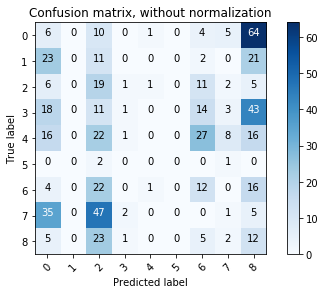

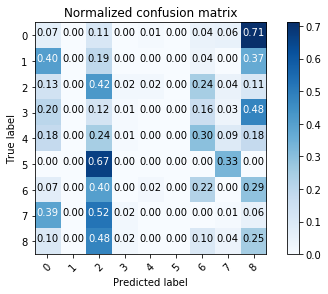

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

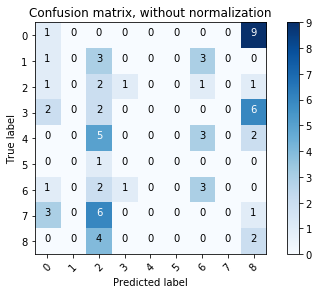

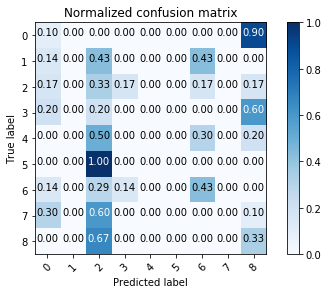



C = 100
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5       0.00      0.00      0.

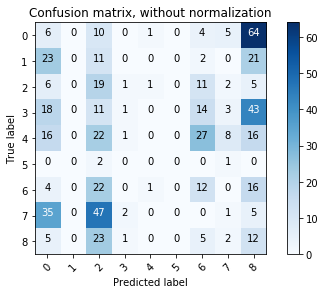

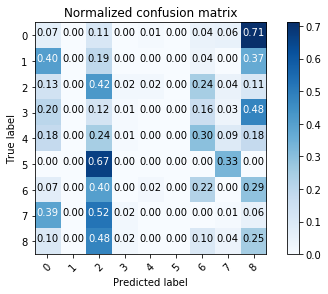

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

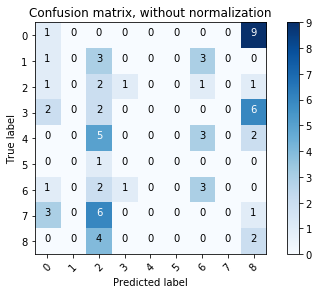

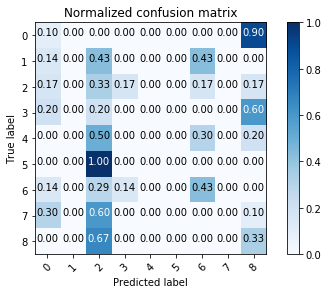



C = 500
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5       0.00      0.00      0.

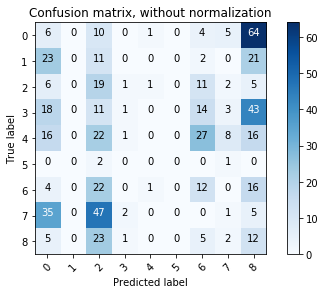

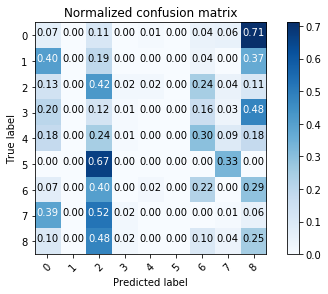

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

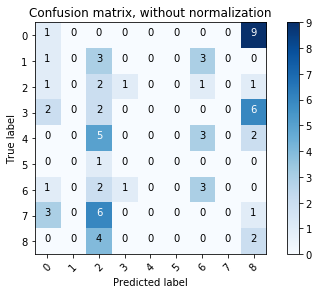

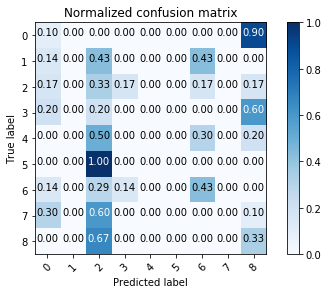

In [238]:
for C in [1.0, 0.2, 12.5, 100, 500]:
    print("")
    print("")
    print("C =", C)
    parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=C, kernel='linear', degree=3)



C = 1.0
kernel = poly


C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.62      0.77        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.57      0.72        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.42      0.39       568

accuracy: 0.4225352112676056
 0.49 0.42 0.39
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5       0.00      0.00      0.00        

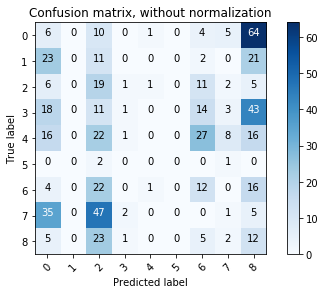

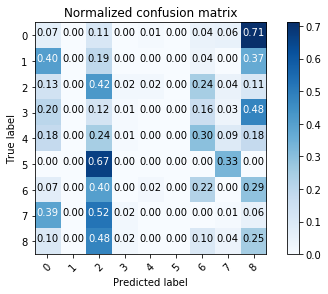

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

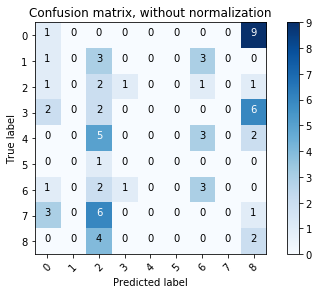

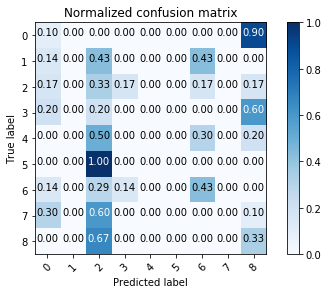



C = 1.0
kernel = sigmoid
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5       0.00 

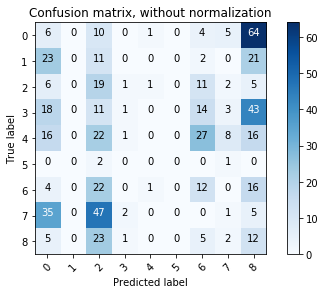

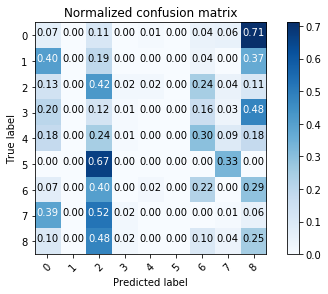

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

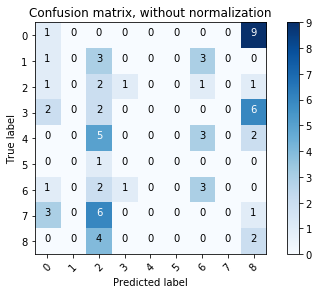

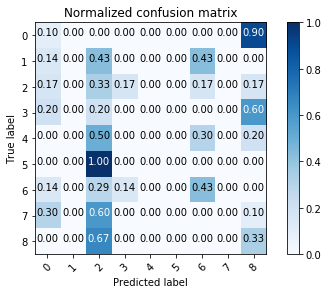



C = 0.2
kernel = poly
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.62      0.77        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.57      0.72        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.42      0.39       568

accuracy: 0.4225352112676056
 0.49 0.42 0.39
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5       0.00    

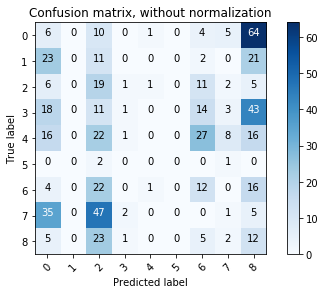

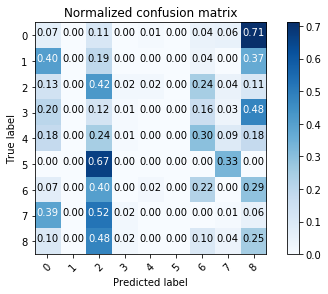

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

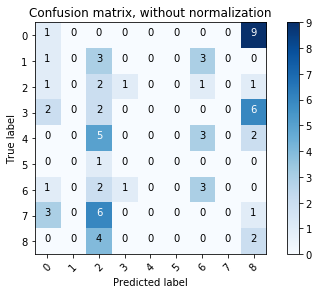

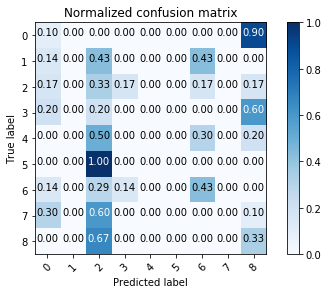



C = 0.2
kernel = sigmoid
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5       0.00 

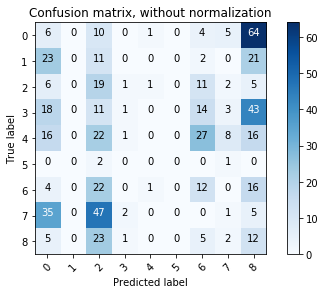

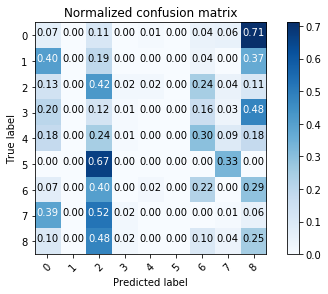

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

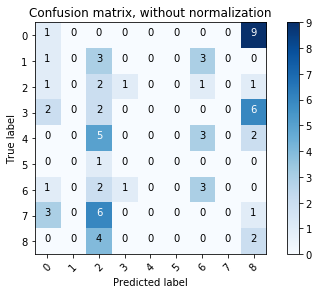

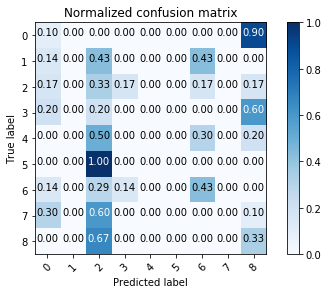



C = 12.5
kernel = poly
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.62      0.77        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.57      0.72        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.42      0.39       568

accuracy: 0.4225352112676056
 0.49 0.42 0.39
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5       0.00   

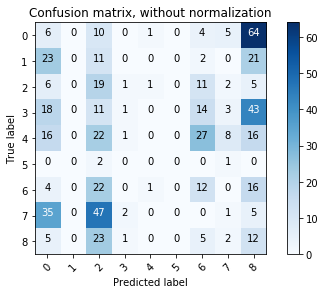

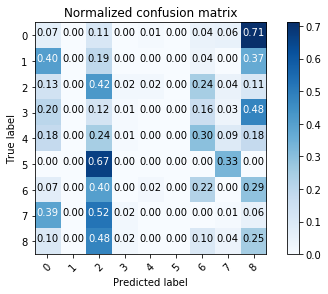

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

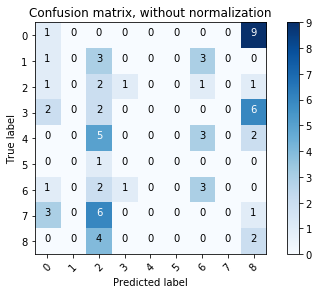

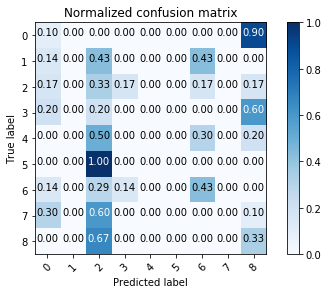



C = 12.5
kernel = sigmoid
             precision    recall  f1-score   support

          0       0.72      0.56      0.63        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.93      0.89      0.91        90
          4       0.28      0.99      0.44        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.97      0.64      0.77        90
          8       0.00      0.00      0.00        48

avg / total       0.56      0.55      0.51       568

accuracy: 0.5528169014084507
 0.56 0.55 0.51
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.23      1.00      0.38        10
          5       0.00

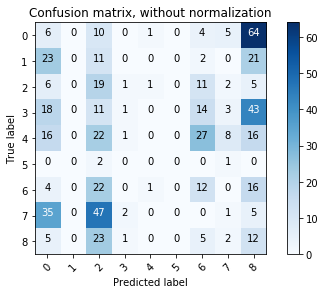

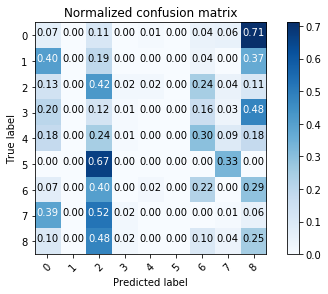

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

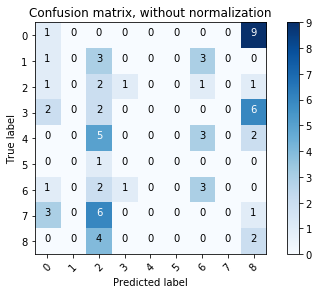

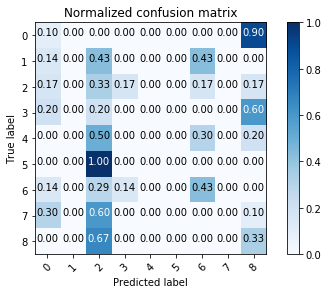



C = 100
kernel = poly
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.62      0.77        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.57      0.72        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.42      0.39       568

accuracy: 0.4225352112676056
 0.49 0.42 0.39
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5       0.00    

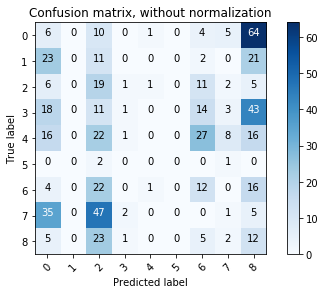

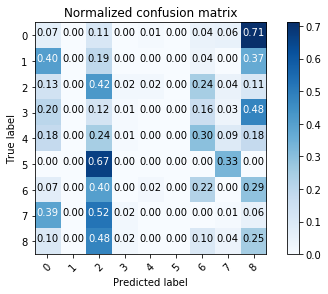

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

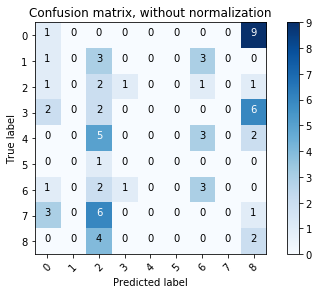

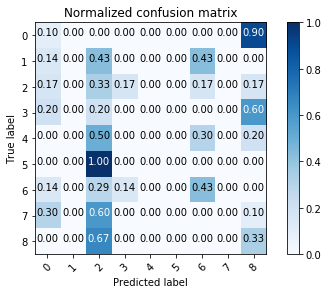



C = 100
kernel = sigmoid
             precision    recall  f1-score   support

          0       0.85      0.73      0.79        90
          1       0.98      0.75      0.85        57
          2       0.81      0.47      0.59        45
          3       0.98      0.97      0.97        90
          4       0.67      0.84      0.75        90
          5       0.00      0.00      0.00         3
          6       0.97      0.58      0.73        55
          7       0.55      0.99      0.70        90
          8       0.86      0.38      0.52        48

avg / total       0.81      0.76      0.75       568

accuracy: 0.7605633802816901
 0.81 0.76 0.75
             precision    recall  f1-score   support

          0       0.69      0.90      0.78        10
          1       1.00      0.43      0.60         7
          2       1.00      0.17      0.29         6
          3       1.00      0.70      0.82        10
          4       0.50      0.90      0.64        10
          5       0.00 

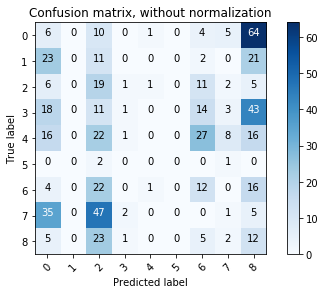

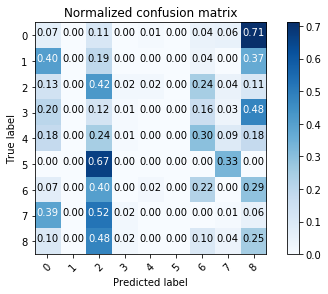

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

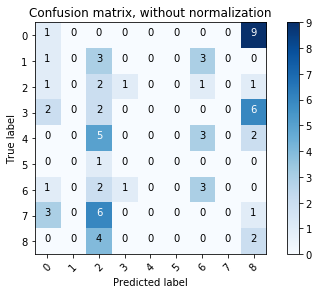

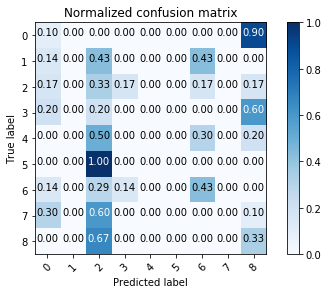



C = 500
kernel = poly
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.62      0.77        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.57      0.72        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.42      0.39       568

accuracy: 0.4225352112676056
 0.49 0.42 0.39
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5       0.00    

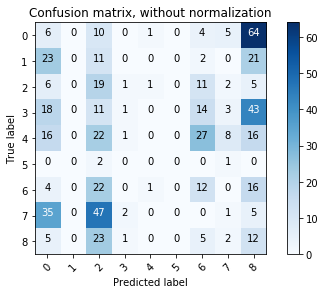

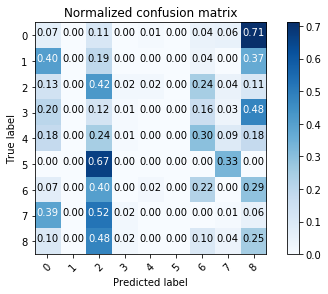

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

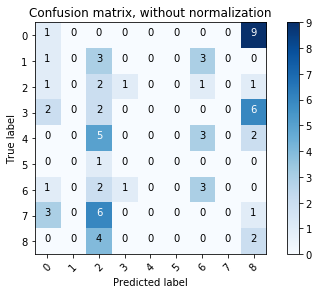

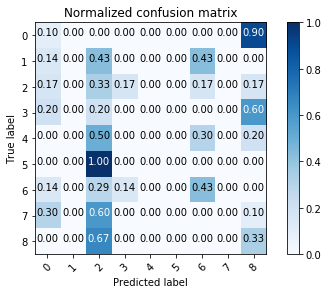



C = 500
kernel = sigmoid
             precision    recall  f1-score   support

          0       0.88      0.83      0.86        90
          1       0.98      0.81      0.88        57
          2       0.86      0.67      0.75        45
          3       1.00      0.98      0.99        90
          4       0.89      0.88      0.88        90
          5       1.00      0.33      0.50         3
          6       1.00      0.64      0.78        55
          7       0.58      0.97      0.72        90
          8       0.89      0.69      0.78        48

avg / total       0.87      0.83      0.84       568

accuracy: 0.8345070422535211
 0.87 0.83 0.84
             precision    recall  f1-score   support

          0       0.64      0.90      0.75        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.89      0.80      0.84        10
          5       0.00 

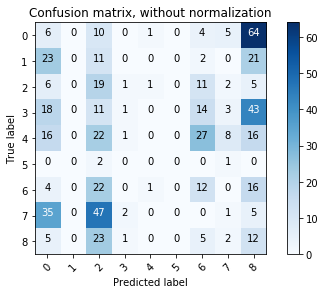

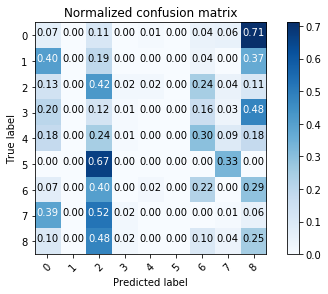

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

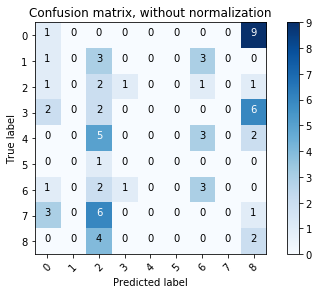

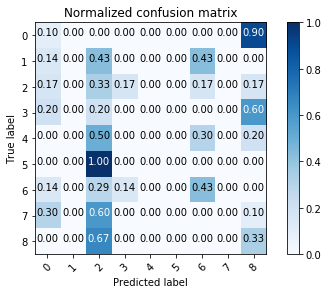

In [240]:
for C in [1.0, 0.2, 12.5, 100, 500]:
    for kernel in ['poly', 'sigmoid']:
        print("")
        print("")
        print("C =", C)
        print("kernel =", kernel)
        parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=C, kernel=kernel, degree=3)



C = 1.0
kernel = rbf
degree = 2


C:\Program Files\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5       0.00      0.00      0.00        

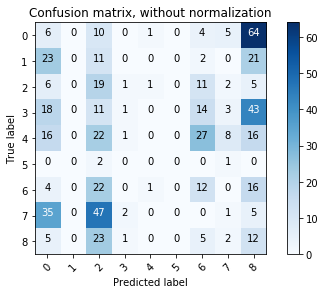

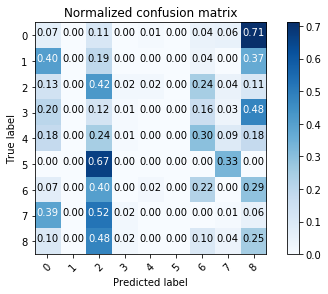

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

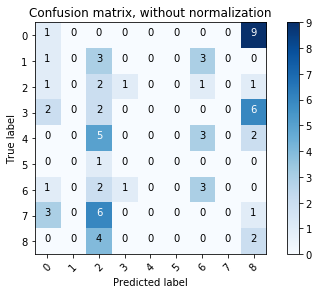

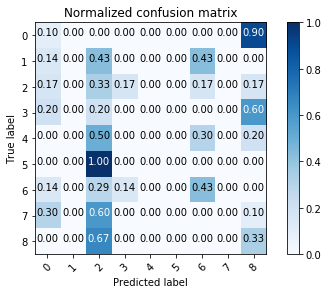



C = 1.0
kernel = rbf
degree = 4
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

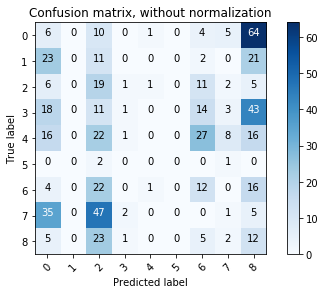

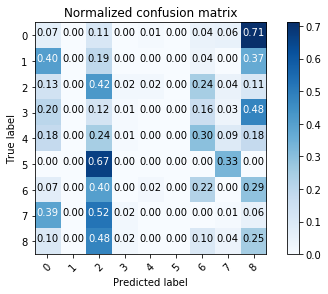

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

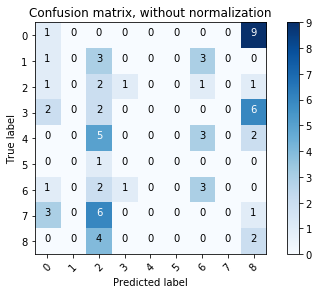

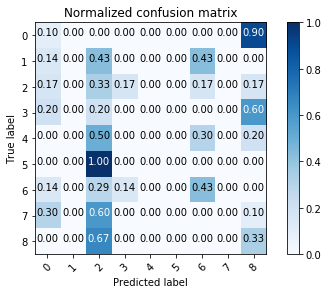



C = 1.0
kernel = rbf
degree = 5
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

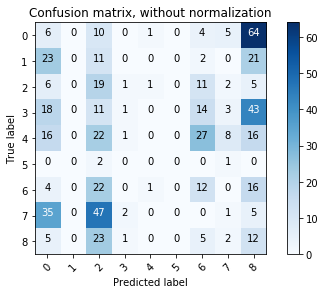

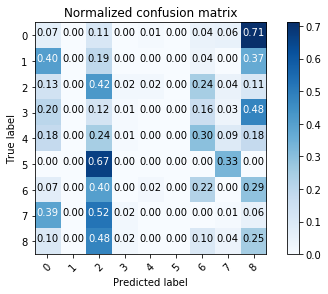

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

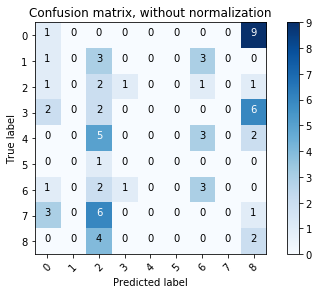

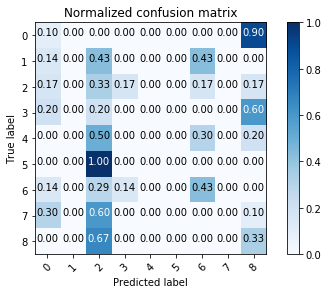



C = 1.0
kernel = rbf
degree = 6
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

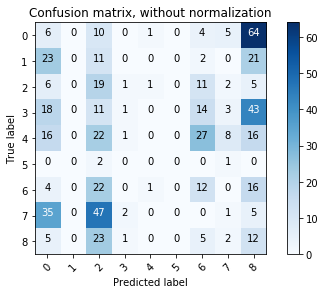

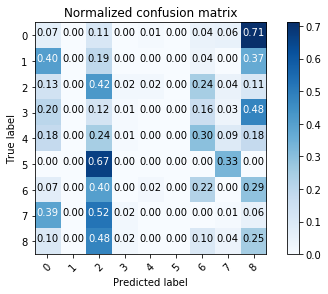

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

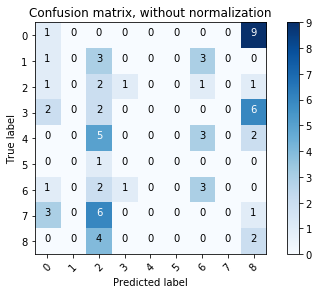

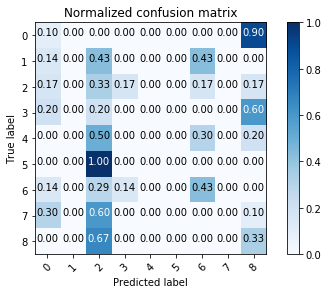



C = 1.0
kernel = rbf
degree = 10
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5    

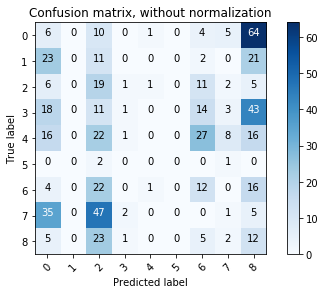

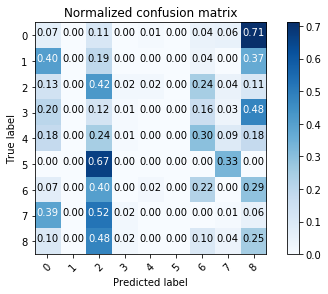

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

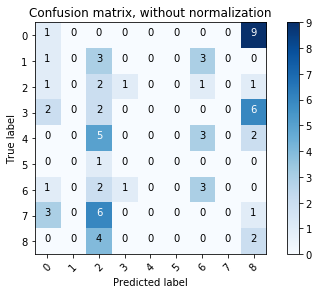

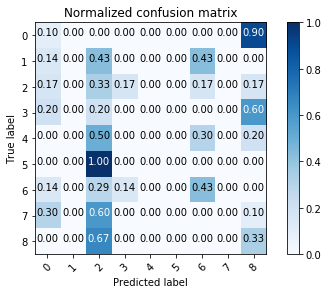



C = 1.0
kernel = linear
degree = 2
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5  

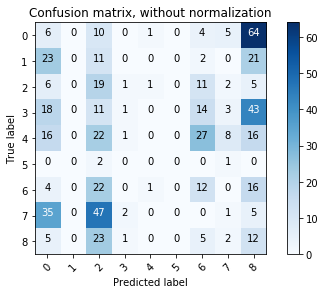

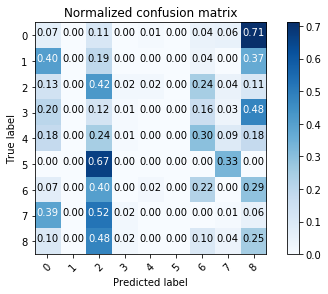

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

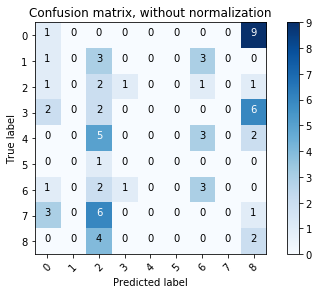

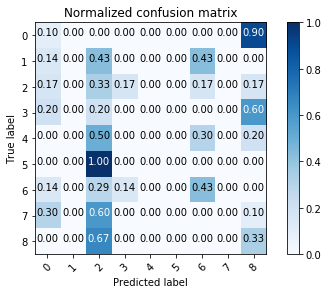



C = 1.0
kernel = linear
degree = 4
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5  

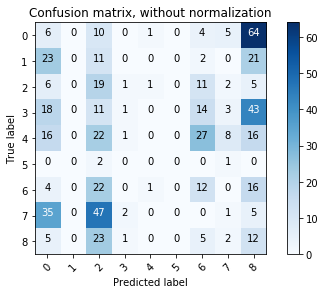

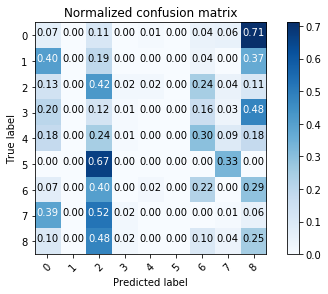

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

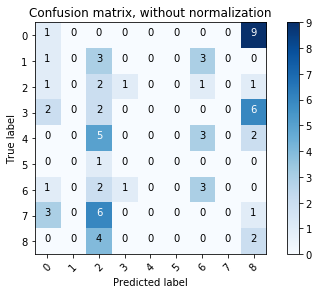

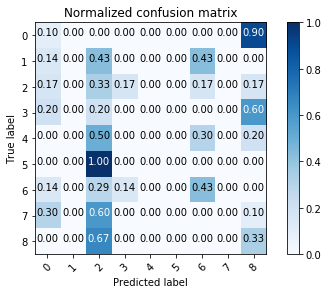



C = 1.0
kernel = linear
degree = 5
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5  

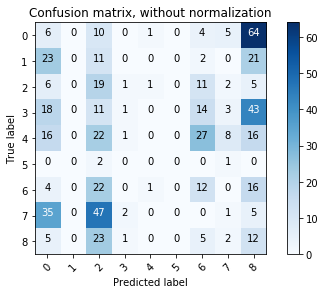

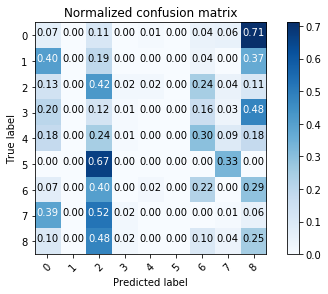

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

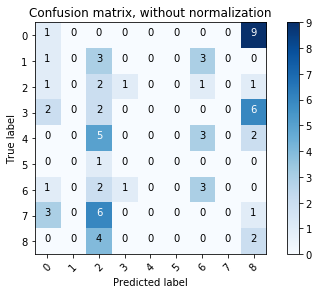

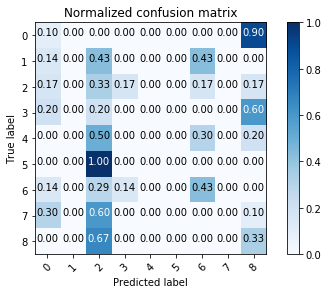



C = 1.0
kernel = linear
degree = 6
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5  

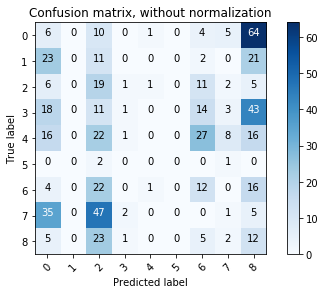

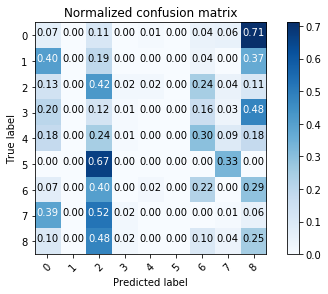

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

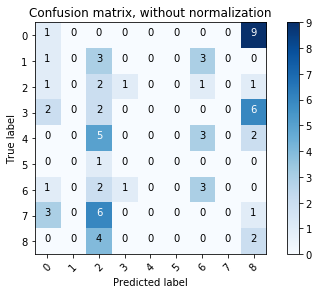

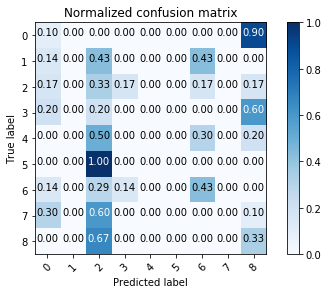



C = 1.0
kernel = linear
degree = 10
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5 

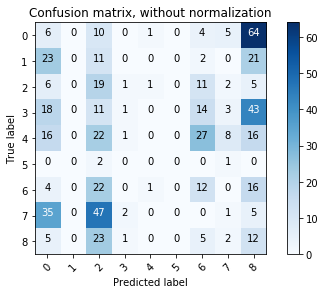

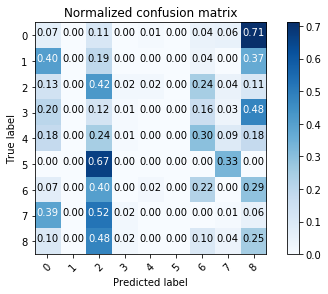

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

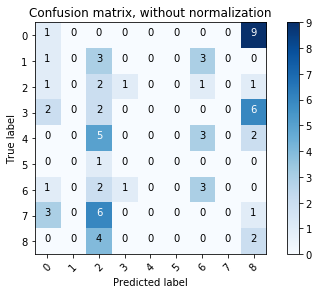

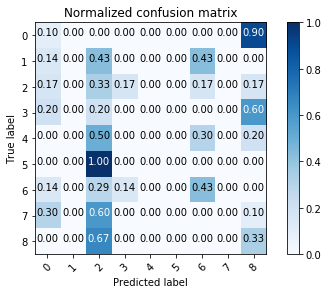



C = 1.0
kernel = poly
degree = 2
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.72      0.84        90
          4       0.23      1.00      0.37        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.98      0.59      0.74        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.44      0.41       568

accuracy: 0.44190140845070425
 0.49 0.44 0.41
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

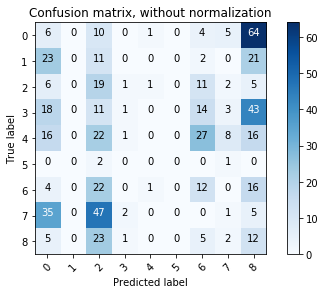

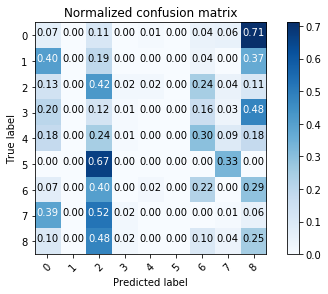

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

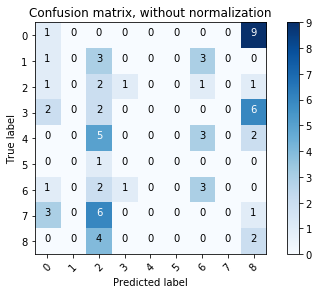

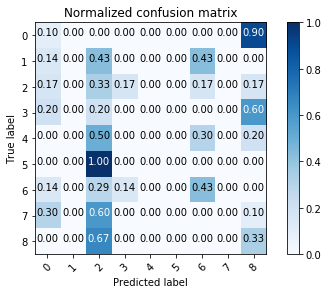



C = 1.0
kernel = poly
degree = 4
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.56      0.71        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4137323943661972
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

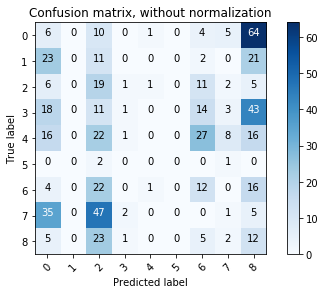

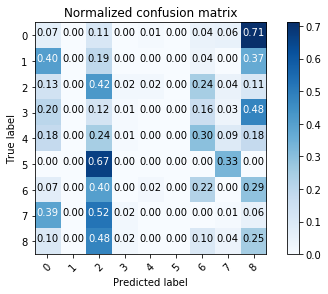

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

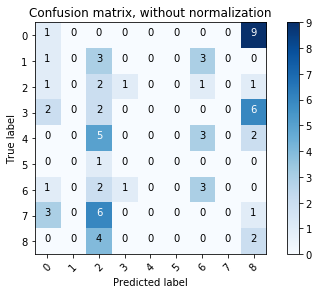

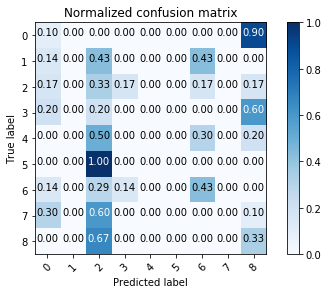



C = 1.0
kernel = poly
degree = 5
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

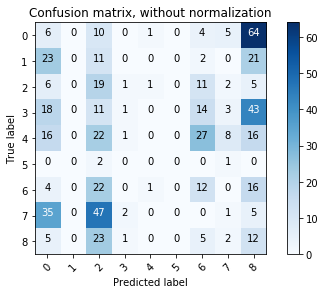

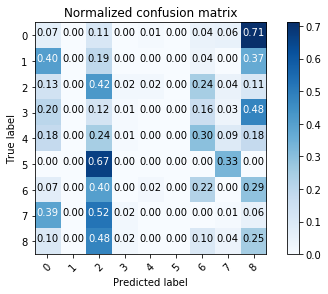

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

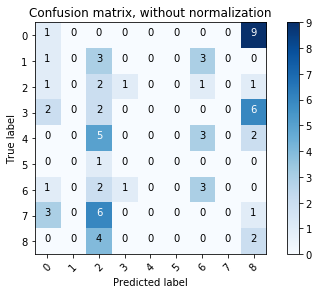

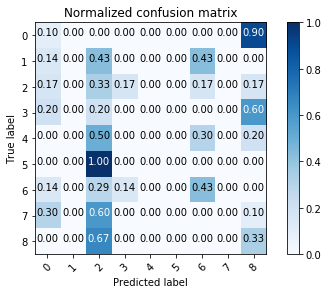



C = 1.0
kernel = poly
degree = 6
             precision    recall  f1-score   support

          0       0.88      0.47      0.61        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.59      0.74        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

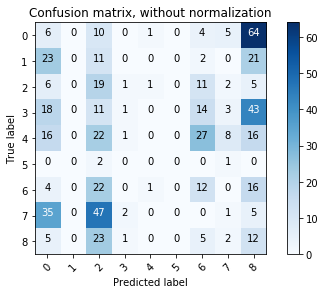

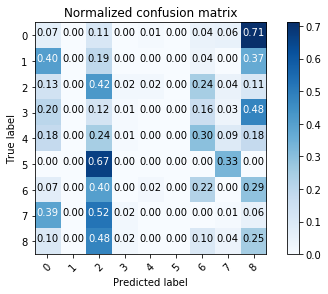

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

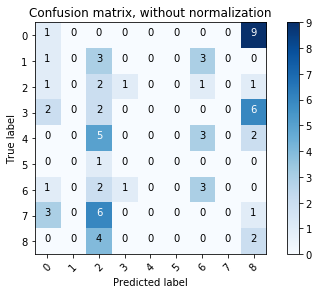

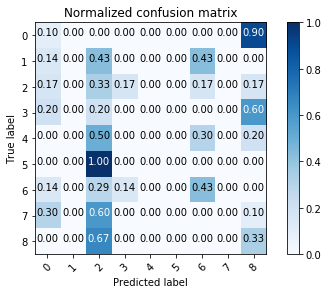



C = 1.0
kernel = poly
degree = 10
             precision    recall  f1-score   support

          0       0.55      0.90      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.85      0.98      0.91        90
          4       0.53      0.90      0.67        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.54      0.99      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.39      0.60      0.47       568

accuracy: 0.596830985915493
 0.39 0.60 0.47
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       0.70      0.70      0.70        10
          4       0.36      0.80      0.50        10
          5    

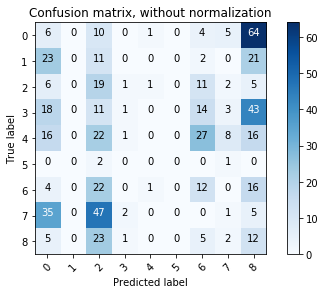

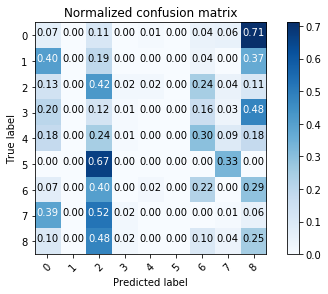

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

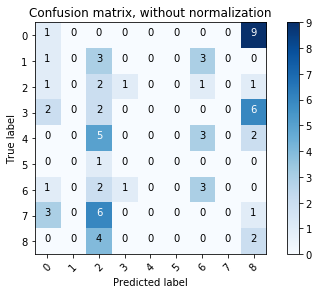

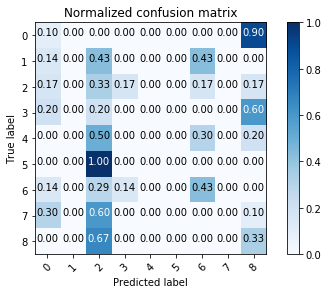



C = 1.0
kernel = sigmoid
degree = 2
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

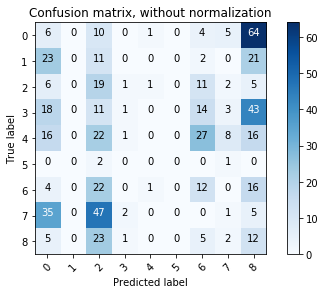

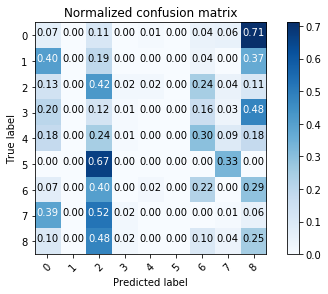

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

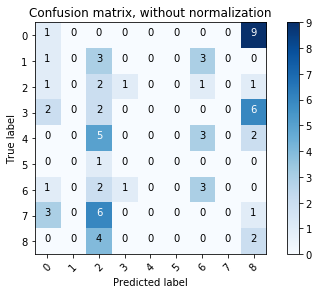

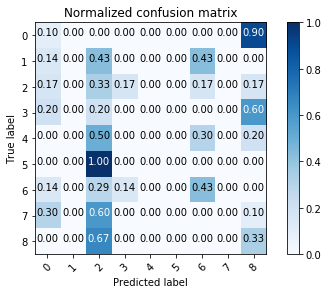



C = 1.0
kernel = sigmoid
degree = 4
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

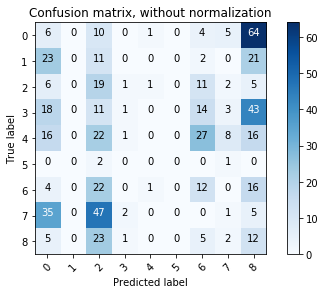

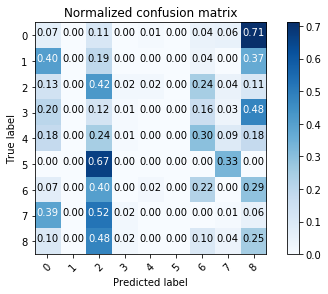

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

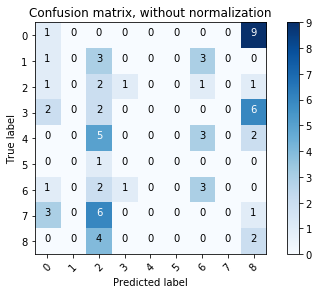

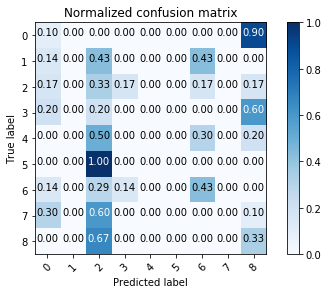



C = 1.0
kernel = sigmoid
degree = 5
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

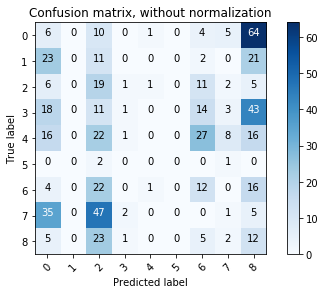

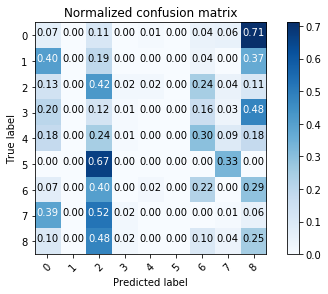

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

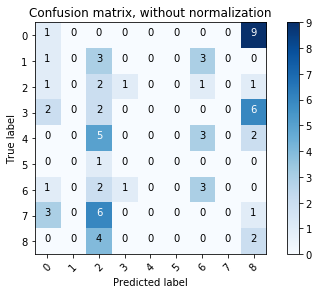

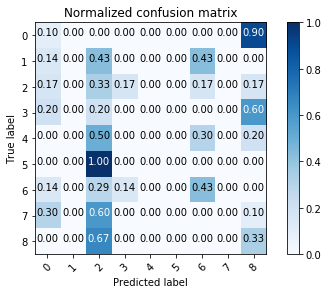



C = 1.0
kernel = sigmoid
degree = 6
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

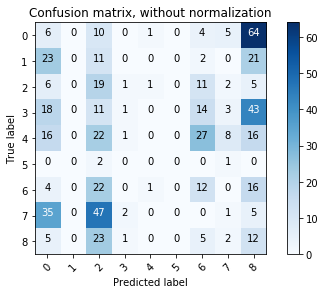

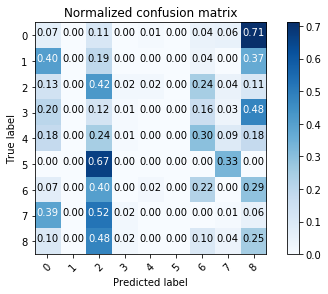

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

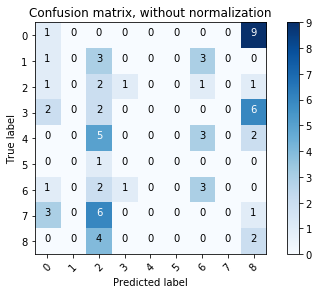

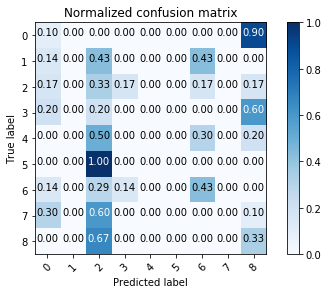



C = 1.0
kernel = sigmoid
degree = 10
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5

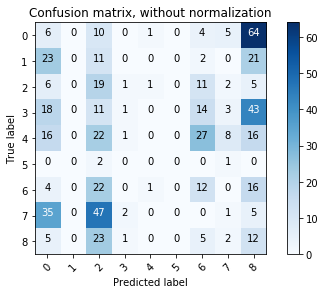

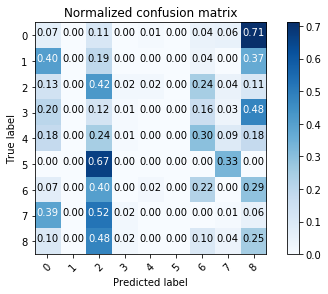

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

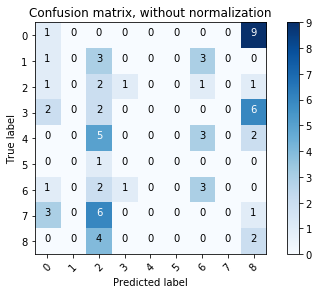

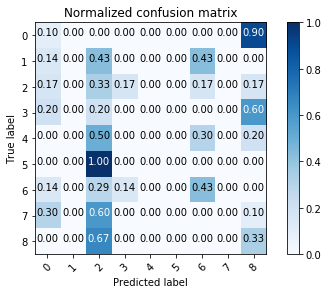



C = 0.2
kernel = rbf
degree = 2
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

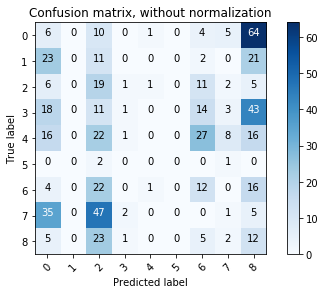

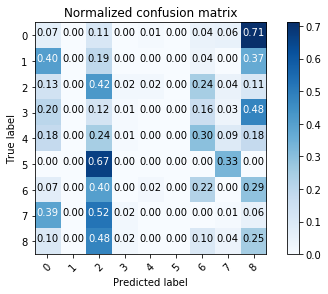

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

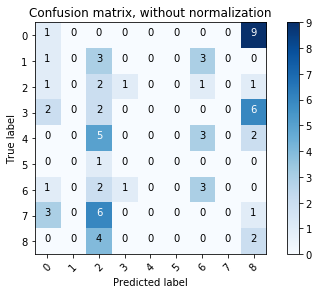

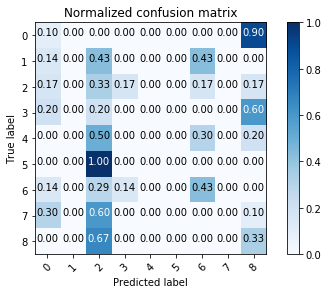



C = 0.2
kernel = rbf
degree = 4
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

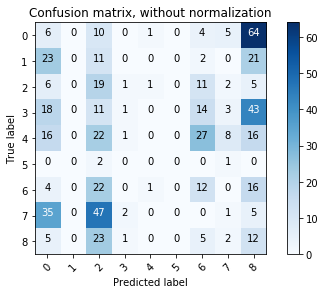

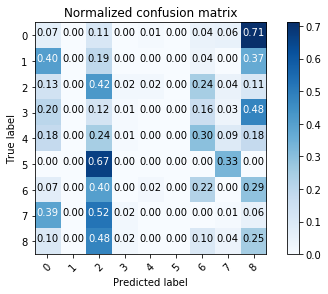

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

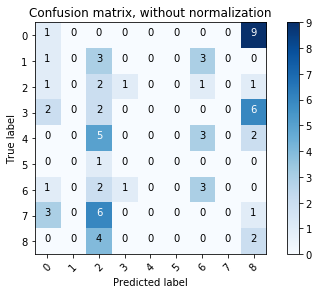

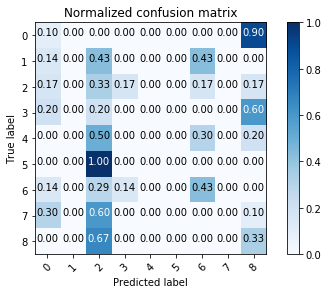



C = 0.2
kernel = rbf
degree = 5
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

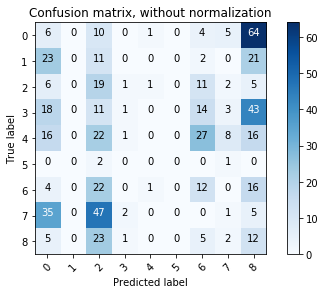

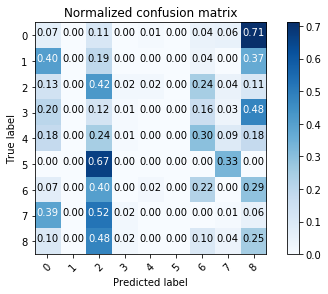

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

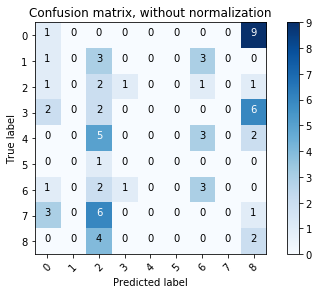

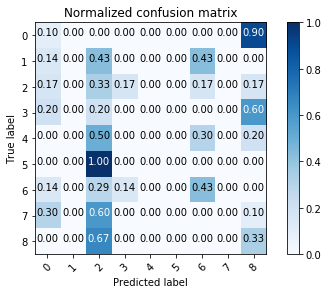



C = 0.2
kernel = rbf
degree = 6
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5     

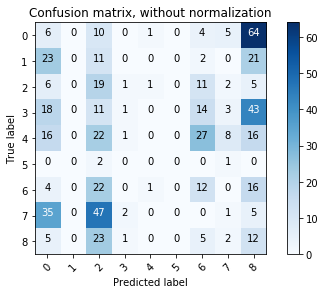

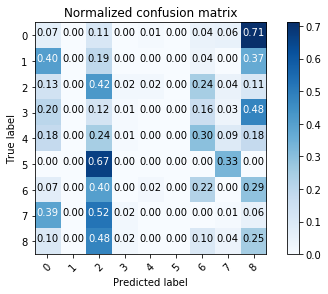

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

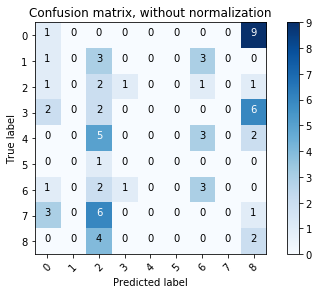

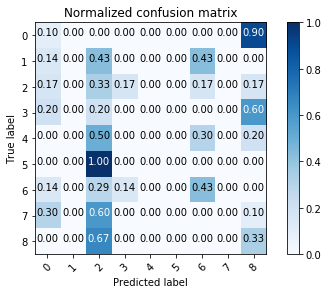



C = 0.2
kernel = rbf
degree = 10
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5    

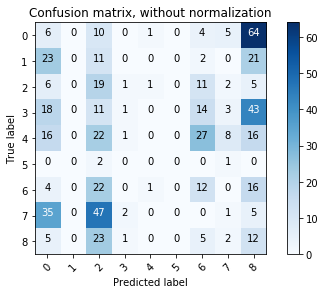

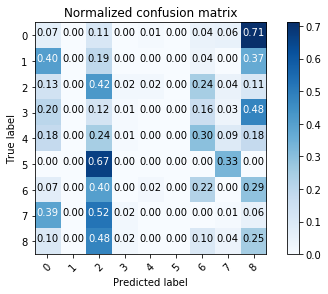

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

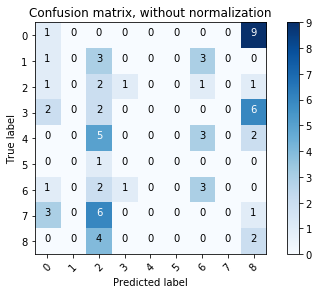

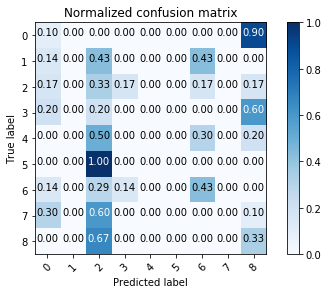



C = 0.2
kernel = linear
degree = 2
             precision    recall  f1-score   support

          0       0.86      0.61      0.71        90
          1       0.97      0.65      0.78        57
          2       1.00      0.20      0.33        45
          3       0.96      0.97      0.96        90
          4       0.48      0.90      0.63        90
          5       0.00      0.00      0.00         3
          6       0.95      0.33      0.49        55
          7       0.54      0.97      0.70        90
          8       0.84      0.33      0.48        48

avg / total       0.79      0.69      0.67       568

accuracy: 0.6866197183098591
 0.79 0.69 0.67
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.40      0.80      0.53        10
          5  

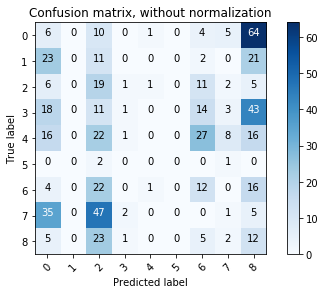

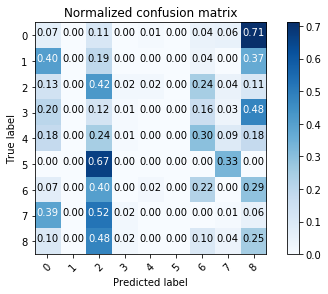

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

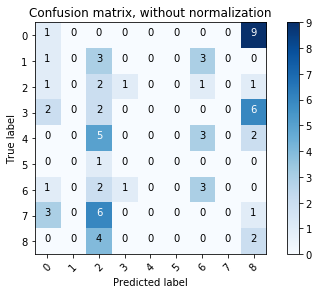

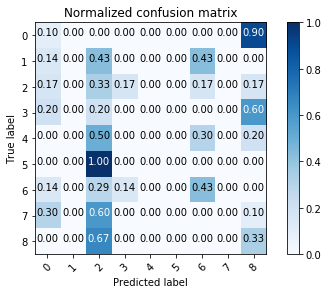



C = 0.2
kernel = linear
degree = 4
             precision    recall  f1-score   support

          0       0.86      0.61      0.71        90
          1       0.97      0.65      0.78        57
          2       1.00      0.20      0.33        45
          3       0.96      0.97      0.96        90
          4       0.48      0.90      0.63        90
          5       0.00      0.00      0.00         3
          6       0.95      0.33      0.49        55
          7       0.54      0.97      0.70        90
          8       0.84      0.33      0.48        48

avg / total       0.79      0.69      0.67       568

accuracy: 0.6866197183098591
 0.79 0.69 0.67
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.40      0.80      0.53        10
          5  

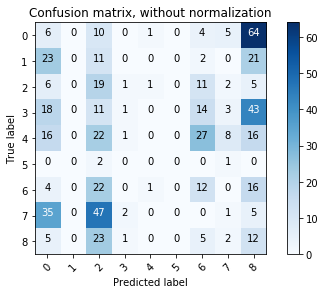

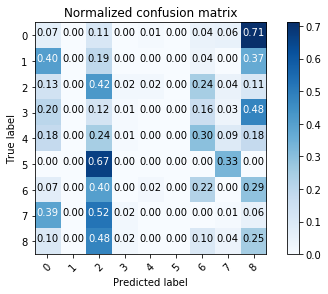

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

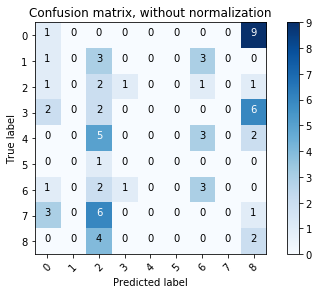

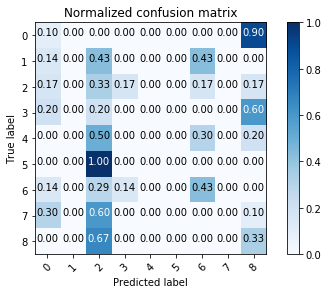



C = 0.2
kernel = linear
degree = 5
             precision    recall  f1-score   support

          0       0.86      0.61      0.71        90
          1       0.97      0.65      0.78        57
          2       1.00      0.20      0.33        45
          3       0.96      0.97      0.96        90
          4       0.48      0.90      0.63        90
          5       0.00      0.00      0.00         3
          6       0.95      0.33      0.49        55
          7       0.54      0.97      0.70        90
          8       0.84      0.33      0.48        48

avg / total       0.79      0.69      0.67       568

accuracy: 0.6866197183098591
 0.79 0.69 0.67
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.40      0.80      0.53        10
          5  

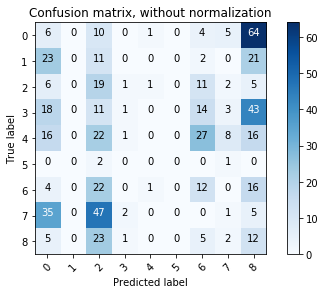

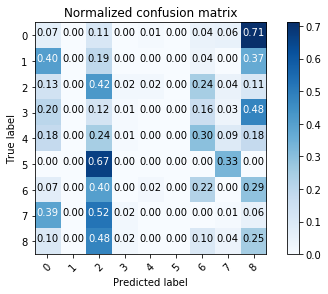

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

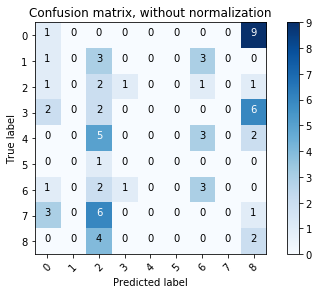

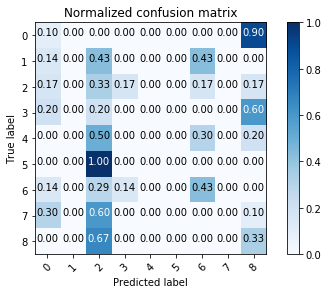



C = 0.2
kernel = linear
degree = 6
             precision    recall  f1-score   support

          0       0.86      0.61      0.71        90
          1       0.97      0.65      0.78        57
          2       1.00      0.20      0.33        45
          3       0.96      0.97      0.96        90
          4       0.48      0.90      0.63        90
          5       0.00      0.00      0.00         3
          6       0.95      0.33      0.49        55
          7       0.54      0.97      0.70        90
          8       0.84      0.33      0.48        48

avg / total       0.79      0.69      0.67       568

accuracy: 0.6866197183098591
 0.79 0.69 0.67
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.40      0.80      0.53        10
          5  

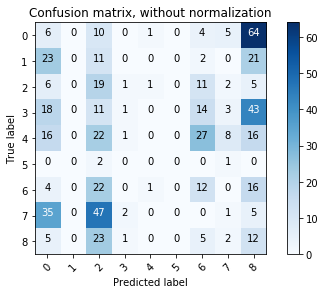

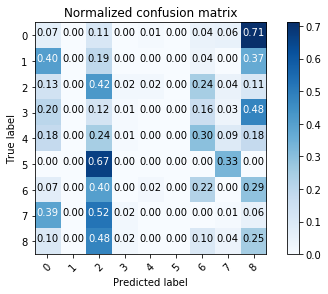

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

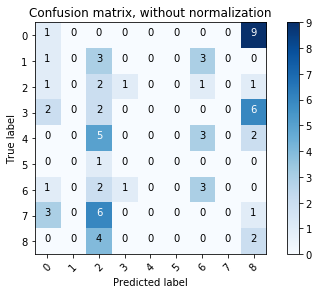

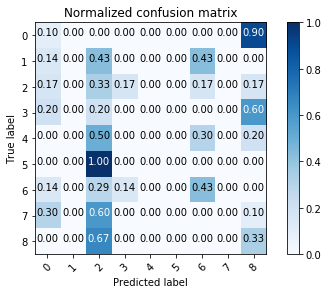



C = 0.2
kernel = linear
degree = 10
             precision    recall  f1-score   support

          0       0.86      0.61      0.71        90
          1       0.97      0.65      0.78        57
          2       1.00      0.20      0.33        45
          3       0.96      0.97      0.96        90
          4       0.48      0.90      0.63        90
          5       0.00      0.00      0.00         3
          6       0.95      0.33      0.49        55
          7       0.54      0.97      0.70        90
          8       0.84      0.33      0.48        48

avg / total       0.79      0.69      0.67       568

accuracy: 0.6866197183098591
 0.79 0.69 0.67
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.40      0.80      0.53        10
          5 

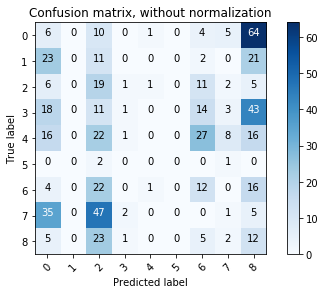

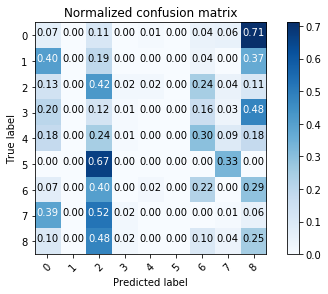

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

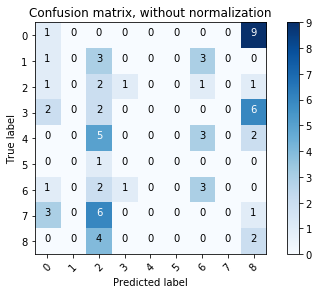

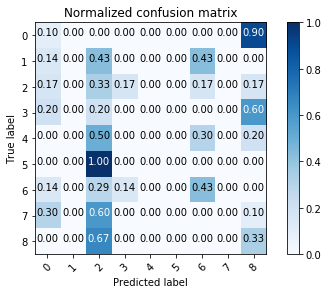



C = 0.2
kernel = poly
degree = 2
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.72      0.84        90
          4       0.23      1.00      0.37        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.98      0.59      0.74        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.44      0.41       568

accuracy: 0.44190140845070425
 0.49 0.44 0.41
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

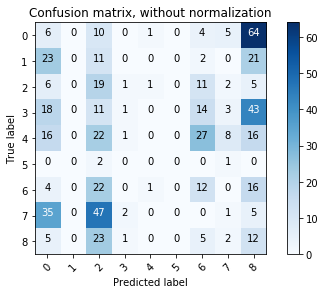

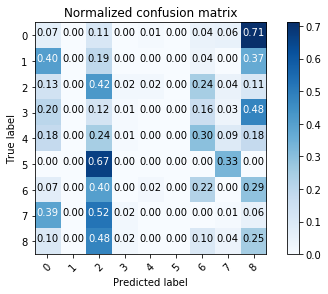

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

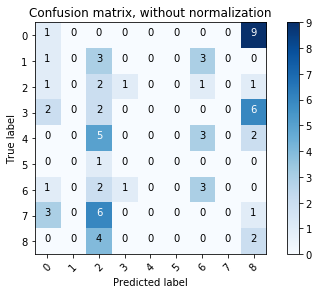

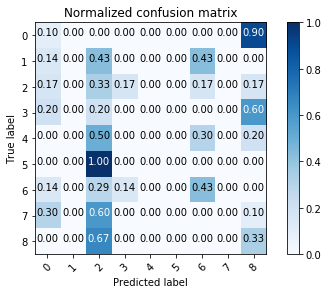



C = 0.2
kernel = poly
degree = 4
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.56      0.71        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4137323943661972
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

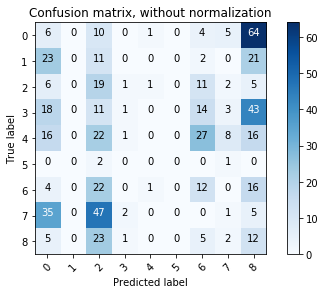

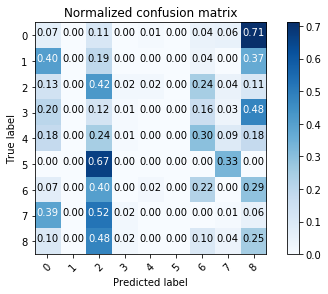

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

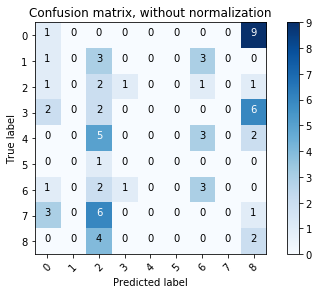

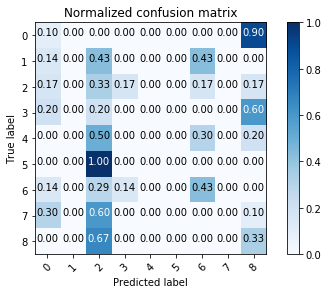



C = 0.2
kernel = poly
degree = 5
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

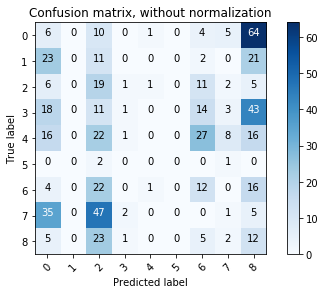

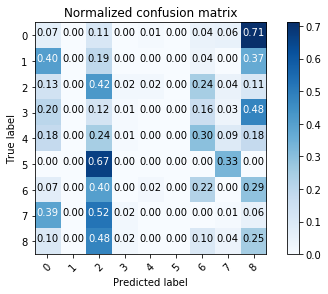

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

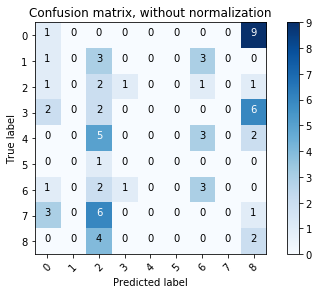

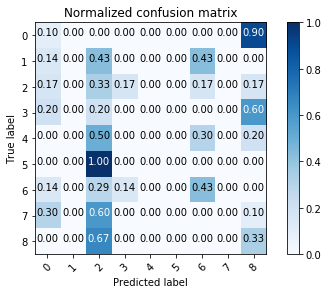



C = 0.2
kernel = poly
degree = 6
             precision    recall  f1-score   support

          0       0.88      0.47      0.61        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.60      0.75        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.54      0.71        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4137323943661972
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

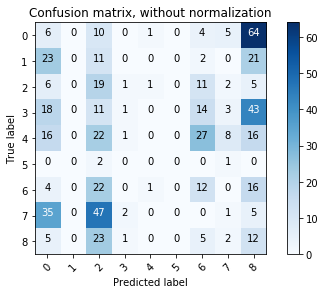

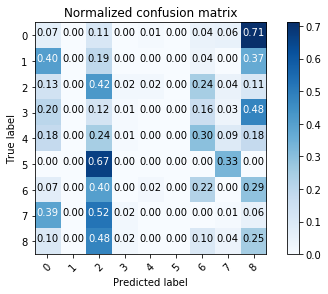

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

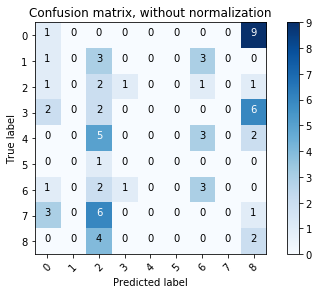

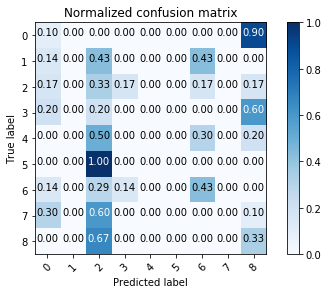



C = 0.2
kernel = poly
degree = 10
             precision    recall  f1-score   support

          0       0.55      0.90      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.85      0.98      0.91        90
          4       0.53      0.90      0.67        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.54      0.99      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.39      0.60      0.47       568

accuracy: 0.596830985915493
 0.39 0.60 0.47
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       0.70      0.70      0.70        10
          4       0.36      0.80      0.50        10
          5    

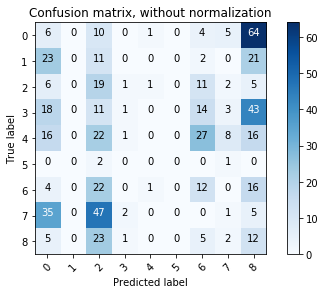

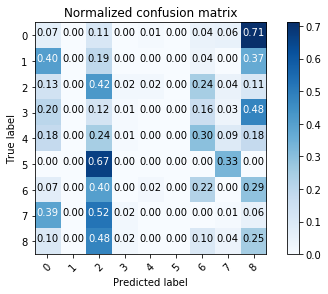

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

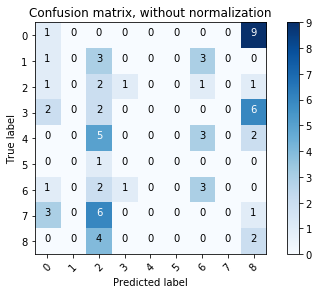

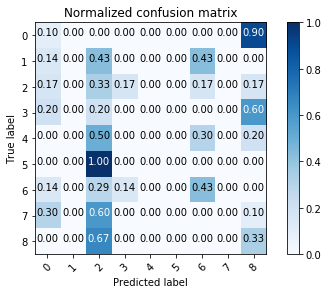



C = 0.2
kernel = sigmoid
degree = 2
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

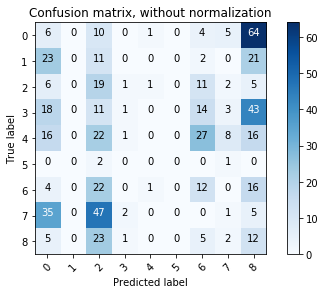

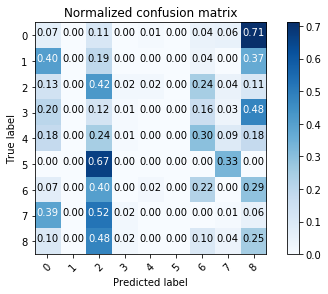

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

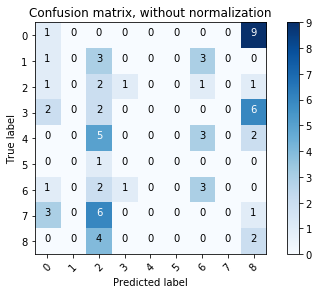

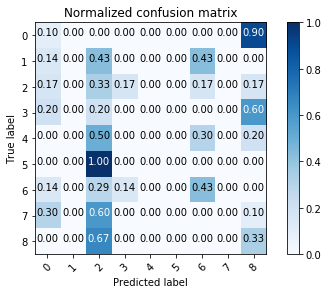



C = 0.2
kernel = sigmoid
degree = 4
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

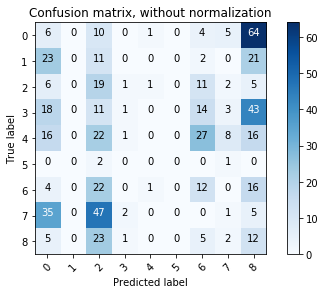

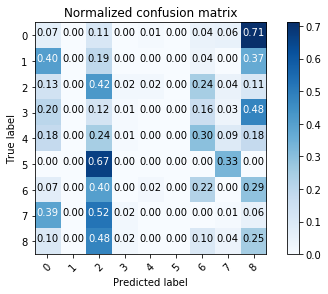

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

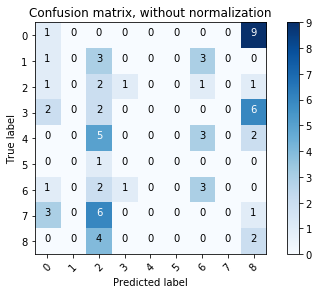

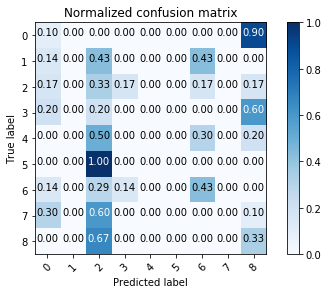



C = 0.2
kernel = sigmoid
degree = 5
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

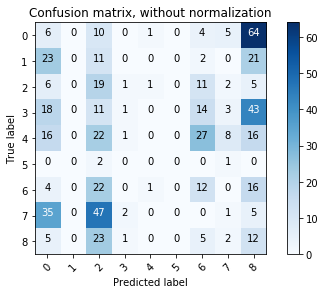

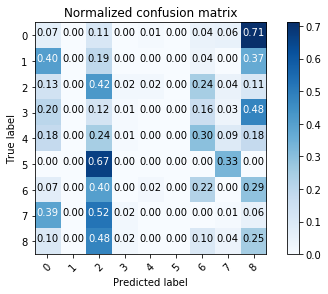

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

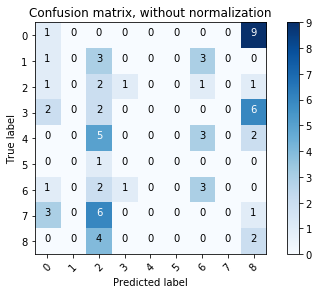

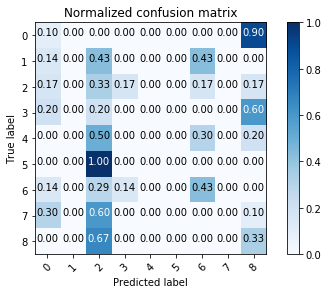



C = 0.2
kernel = sigmoid
degree = 6
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5 

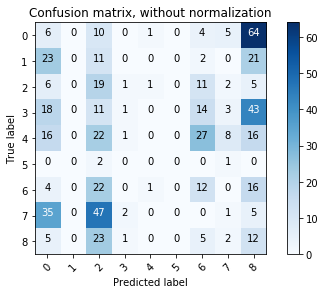

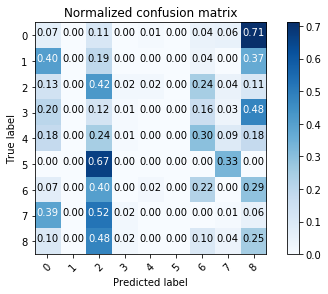

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

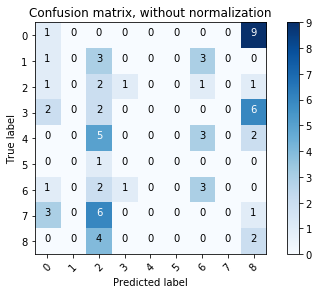

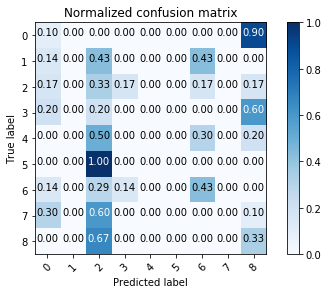



C = 0.2
kernel = sigmoid
degree = 10
             precision    recall  f1-score   support

          0       0.86      0.56      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.94      0.81      0.87        90
          4       0.24      0.99      0.39        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.95      0.63      0.76        90
          8       0.00      0.00      0.00        48

avg / total       0.47      0.47      0.43       568

accuracy: 0.4735915492957746
 0.47 0.47 0.43
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.22      1.00      0.36        10
          5

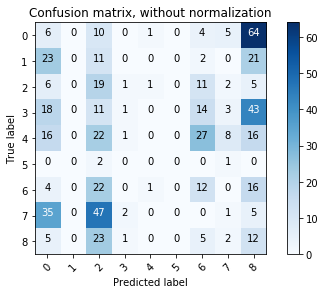

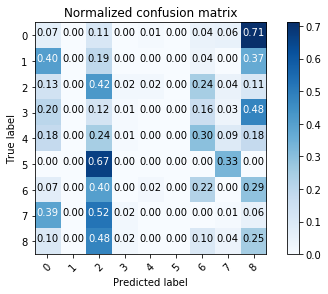

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

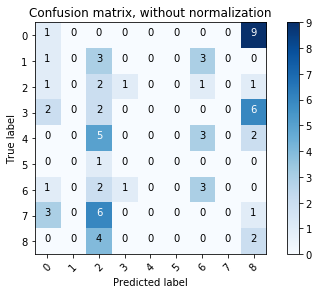

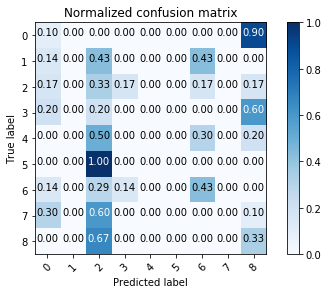



C = 12.5
kernel = rbf
degree = 2
             precision    recall  f1-score   support

          0       0.86      0.57      0.68        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.96      0.96      0.96        90
          4       0.31      1.00      0.47        90
          5       0.00      0.00      0.00         3
          6       1.00      0.07      0.14        55
          7       0.91      0.67      0.77        90
          8       0.84      0.33      0.48        48

avg / total       0.75      0.61      0.59       568

accuracy: 0.6056338028169014
 0.75 0.61 0.59
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.24      1.00      0.38        10
          5    

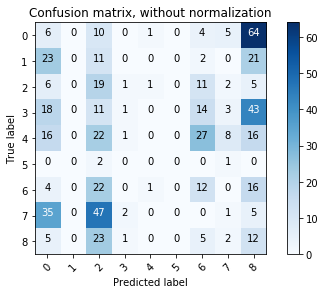

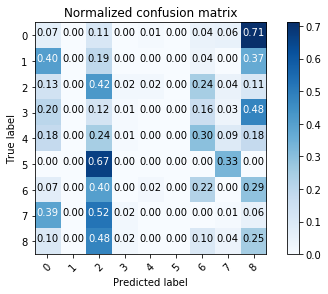

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

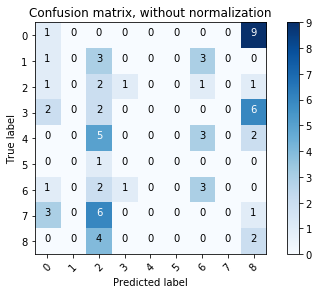

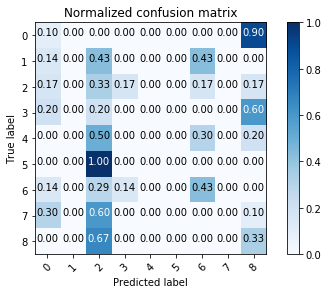



C = 12.5
kernel = rbf
degree = 4
             precision    recall  f1-score   support

          0       0.86      0.57      0.68        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.96      0.96      0.96        90
          4       0.31      1.00      0.47        90
          5       0.00      0.00      0.00         3
          6       1.00      0.07      0.14        55
          7       0.91      0.67      0.77        90
          8       0.84      0.33      0.48        48

avg / total       0.75      0.61      0.59       568

accuracy: 0.6056338028169014
 0.75 0.61 0.59
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.24      1.00      0.38        10
          5    

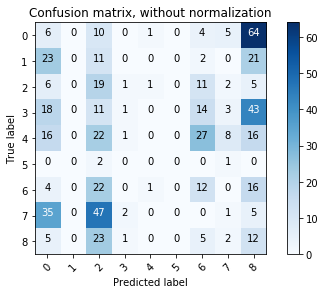

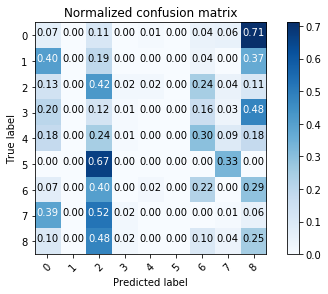

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

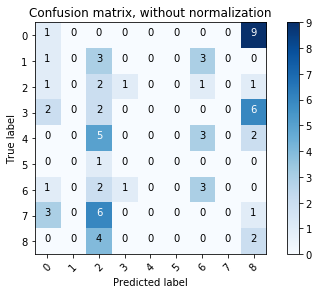

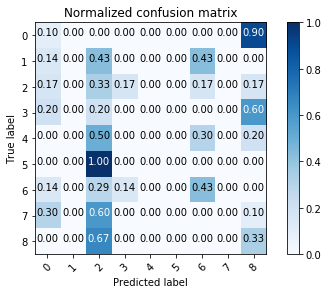



C = 12.5
kernel = rbf
degree = 5
             precision    recall  f1-score   support

          0       0.86      0.57      0.68        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.96      0.96      0.96        90
          4       0.31      1.00      0.47        90
          5       0.00      0.00      0.00         3
          6       1.00      0.07      0.14        55
          7       0.91      0.67      0.77        90
          8       0.84      0.33      0.48        48

avg / total       0.75      0.61      0.59       568

accuracy: 0.6056338028169014
 0.75 0.61 0.59
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.24      1.00      0.38        10
          5    

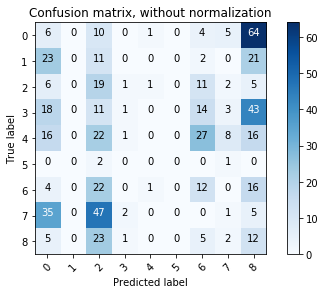

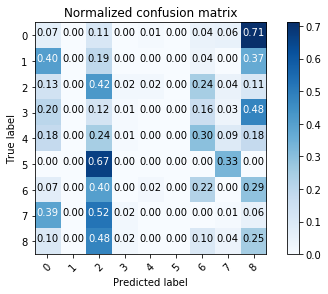

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

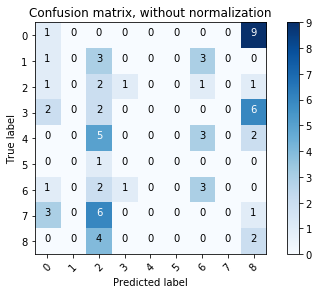

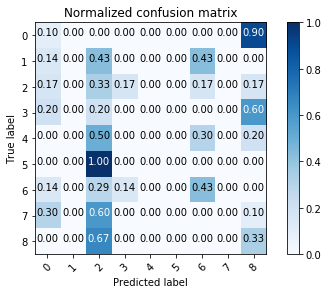



C = 12.5
kernel = rbf
degree = 6
             precision    recall  f1-score   support

          0       0.86      0.57      0.68        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.96      0.96      0.96        90
          4       0.31      1.00      0.47        90
          5       0.00      0.00      0.00         3
          6       1.00      0.07      0.14        55
          7       0.91      0.67      0.77        90
          8       0.84      0.33      0.48        48

avg / total       0.75      0.61      0.59       568

accuracy: 0.6056338028169014
 0.75 0.61 0.59
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.24      1.00      0.38        10
          5    

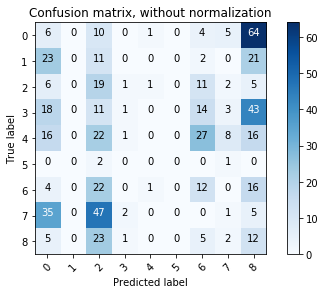

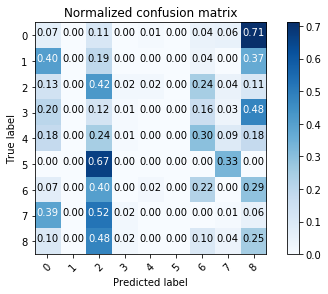

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

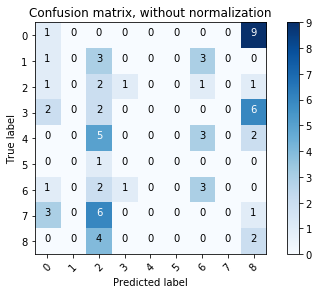

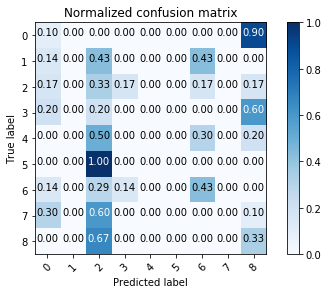



C = 12.5
kernel = rbf
degree = 10
             precision    recall  f1-score   support

          0       0.86      0.57      0.68        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.96      0.96      0.96        90
          4       0.31      1.00      0.47        90
          5       0.00      0.00      0.00         3
          6       1.00      0.07      0.14        55
          7       0.91      0.67      0.77        90
          8       0.84      0.33      0.48        48

avg / total       0.75      0.61      0.59       568

accuracy: 0.6056338028169014
 0.75 0.61 0.59
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.70      0.82        10
          4       0.24      1.00      0.38        10
          5   

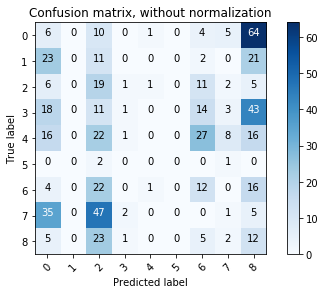

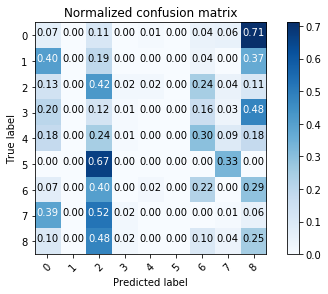

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

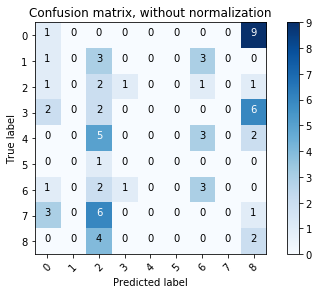

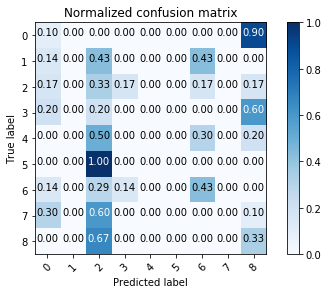



C = 12.5
kernel = linear
degree = 2
             precision    recall  f1-score   support

          0       0.99      0.89      0.94        90
          1       0.98      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       0.98      0.85      0.91        48

avg / total       0.92      0.88      0.89       568

accuracy: 0.8802816901408451
 0.92 0.88 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5 

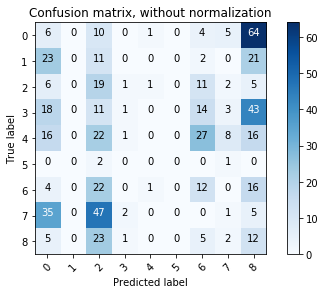

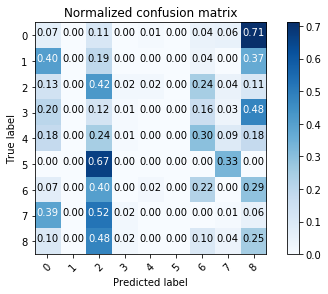

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

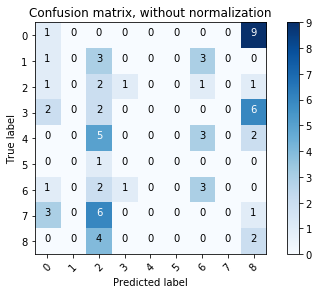

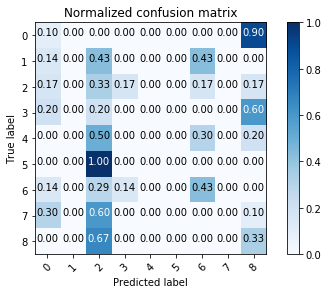



C = 12.5
kernel = linear
degree = 4
             precision    recall  f1-score   support

          0       0.99      0.89      0.94        90
          1       0.98      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       0.98      0.85      0.91        48

avg / total       0.92      0.88      0.89       568

accuracy: 0.8802816901408451
 0.92 0.88 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5 

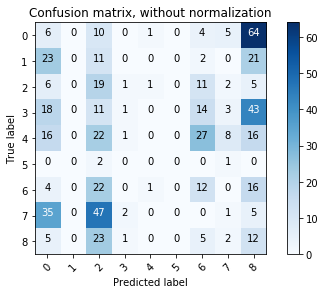

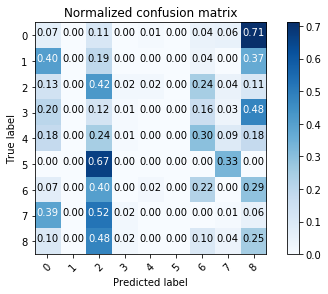

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

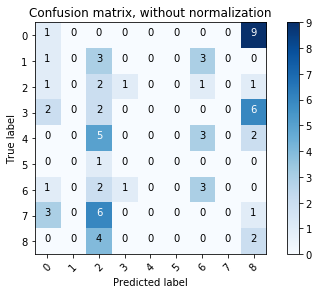

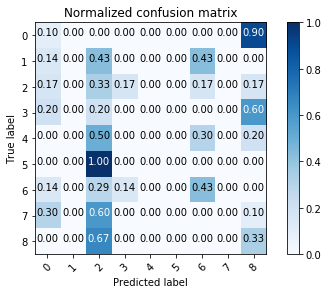



C = 12.5
kernel = linear
degree = 5
             precision    recall  f1-score   support

          0       0.99      0.89      0.94        90
          1       0.98      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       0.98      0.85      0.91        48

avg / total       0.92      0.88      0.89       568

accuracy: 0.8802816901408451
 0.92 0.88 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5 

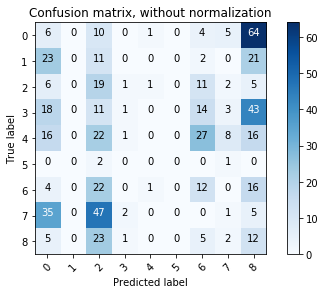

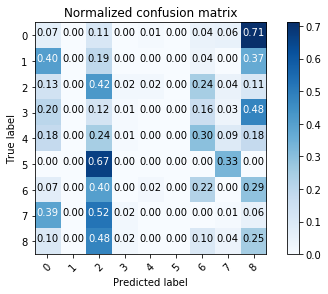

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

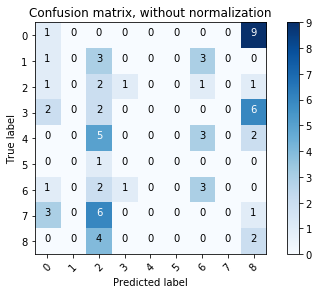

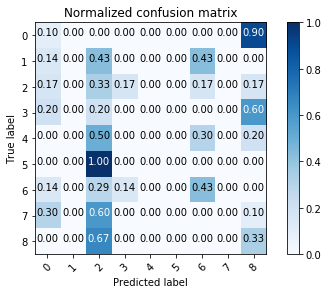



C = 12.5
kernel = linear
degree = 6
             precision    recall  f1-score   support

          0       0.99      0.89      0.94        90
          1       0.98      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       0.98      0.85      0.91        48

avg / total       0.92      0.88      0.89       568

accuracy: 0.8802816901408451
 0.92 0.88 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5 

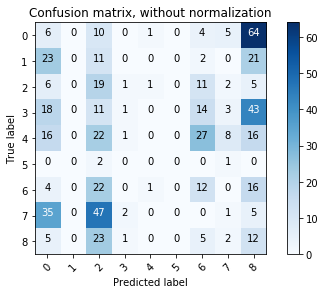

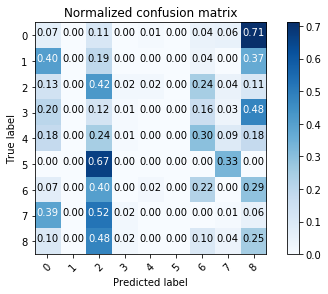

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

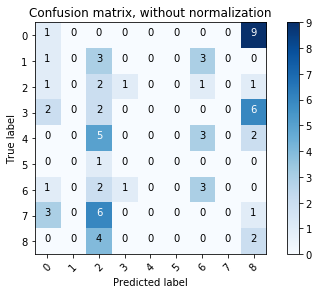

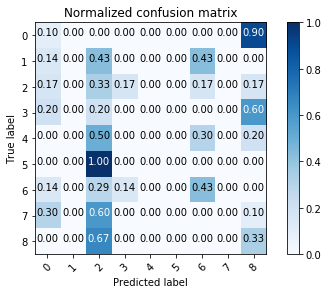



C = 12.5
kernel = linear
degree = 10
             precision    recall  f1-score   support

          0       0.99      0.89      0.94        90
          1       0.98      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       0.98      0.85      0.91        48

avg / total       0.92      0.88      0.89       568

accuracy: 0.8802816901408451
 0.92 0.88 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5

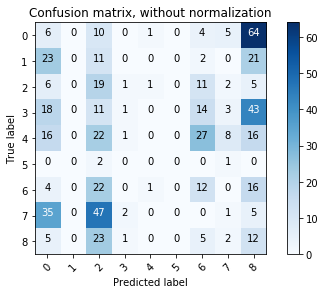

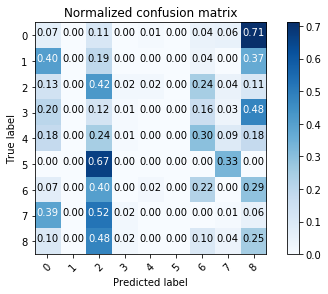

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

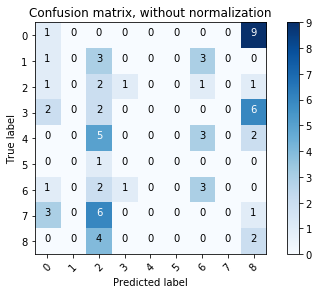

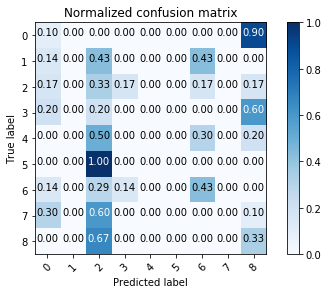



C = 12.5
kernel = poly
degree = 2
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.72      0.84        90
          4       0.23      1.00      0.37        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.98      0.59      0.74        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.44      0.41       568

accuracy: 0.44190140845070425
 0.49 0.44 0.41
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5  

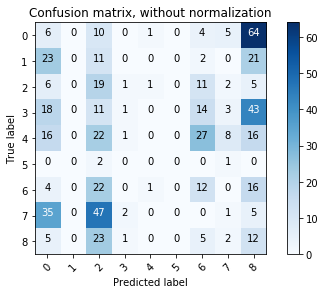

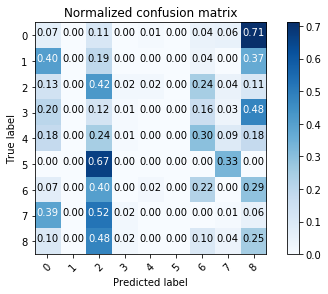

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

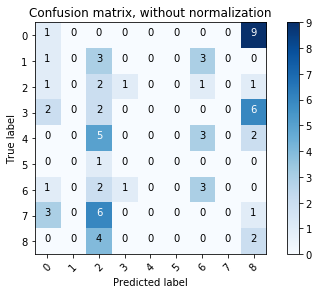

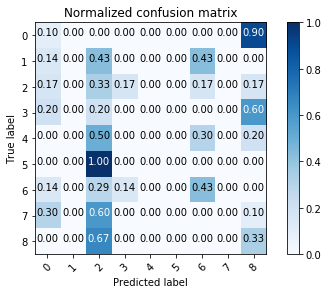



C = 12.5
kernel = poly
degree = 4
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.56      0.71        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4137323943661972
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

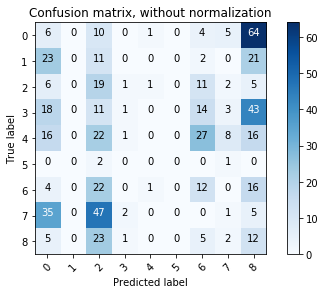

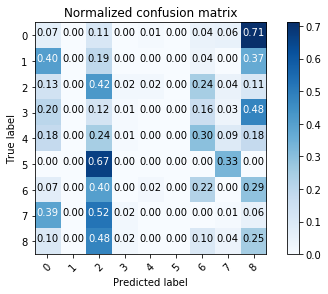

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

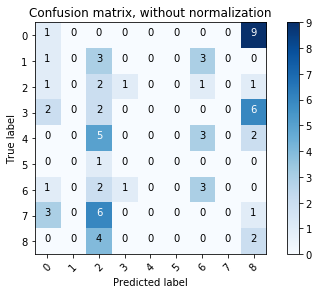

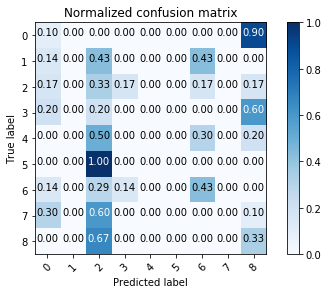



C = 12.5
kernel = poly
degree = 5
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

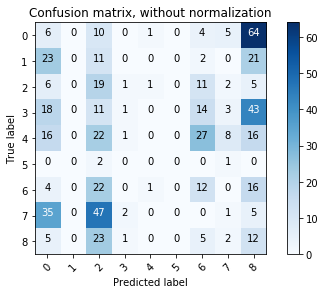

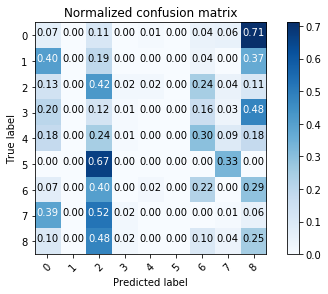

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

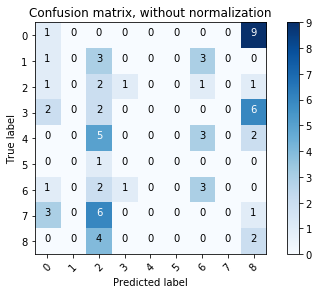

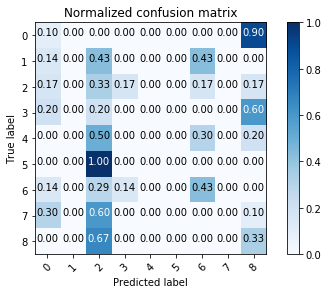



C = 12.5
kernel = poly
degree = 6
             precision    recall  f1-score   support

          0       0.88      0.47      0.61        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.59      0.74        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

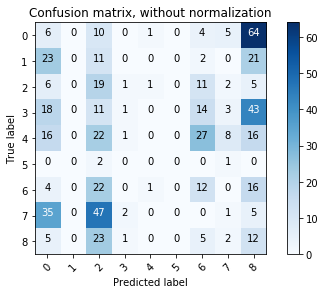

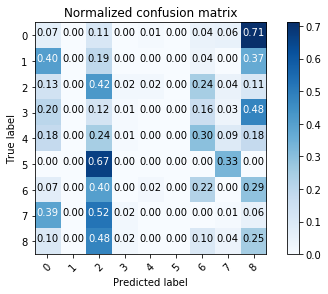

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

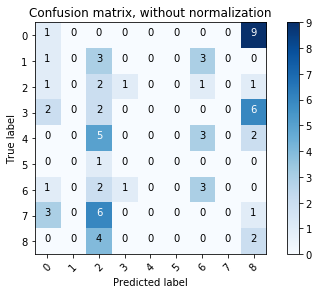

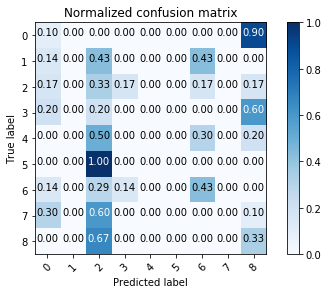



C = 12.5
kernel = poly
degree = 10
             precision    recall  f1-score   support

          0       0.55      0.90      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.85      0.98      0.91        90
          4       0.53      0.90      0.67        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.54      0.99      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.39      0.60      0.47       568

accuracy: 0.596830985915493
 0.39 0.60 0.47
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       0.70      0.70      0.70        10
          4       0.36      0.80      0.50        10
          5   

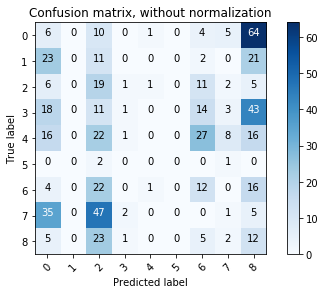

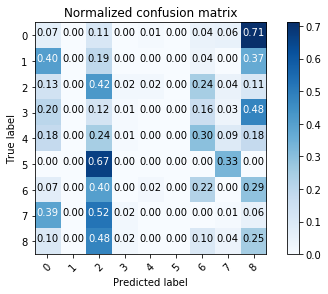

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

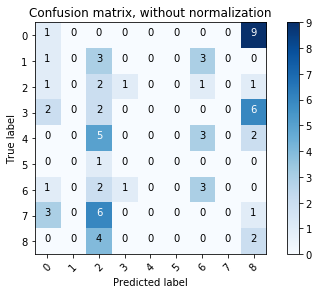

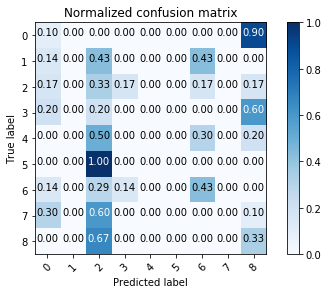



C = 12.5
kernel = sigmoid
degree = 2
             precision    recall  f1-score   support

          0       0.72      0.56      0.63        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.93      0.89      0.91        90
          4       0.28      0.99      0.44        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.97      0.64      0.77        90
          8       0.00      0.00      0.00        48

avg / total       0.56      0.55      0.51       568

accuracy: 0.5528169014084507
 0.56 0.55 0.51
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.23      1.00      0.38        10
          5

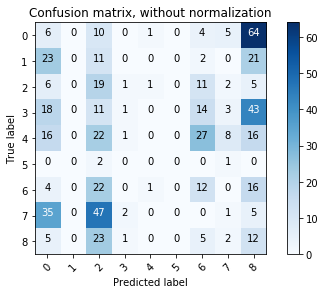

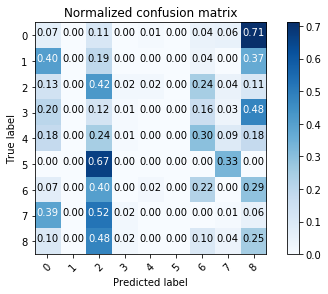

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

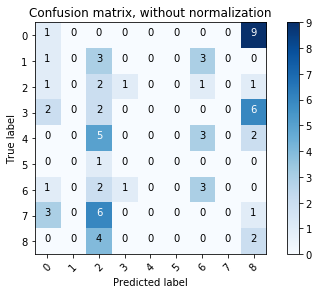

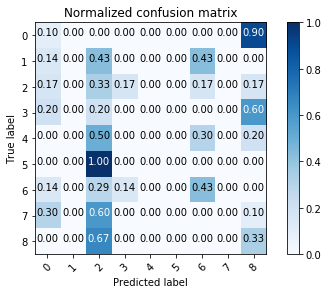



C = 12.5
kernel = sigmoid
degree = 4
             precision    recall  f1-score   support

          0       0.72      0.56      0.63        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.93      0.89      0.91        90
          4       0.28      0.99      0.44        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.97      0.64      0.77        90
          8       0.00      0.00      0.00        48

avg / total       0.56      0.55      0.51       568

accuracy: 0.5528169014084507
 0.56 0.55 0.51
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.23      1.00      0.38        10
          5

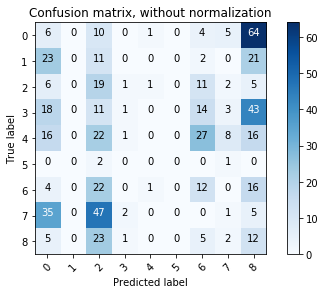

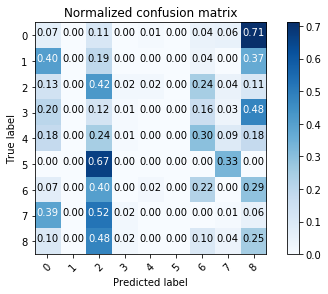

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

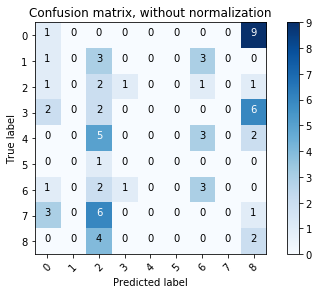

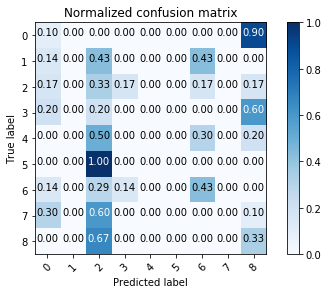



C = 12.5
kernel = sigmoid
degree = 5
             precision    recall  f1-score   support

          0       0.72      0.56      0.63        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.93      0.89      0.91        90
          4       0.28      0.99      0.44        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.97      0.64      0.77        90
          8       0.00      0.00      0.00        48

avg / total       0.56      0.55      0.51       568

accuracy: 0.5528169014084507
 0.56 0.55 0.51
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.23      1.00      0.38        10
          5

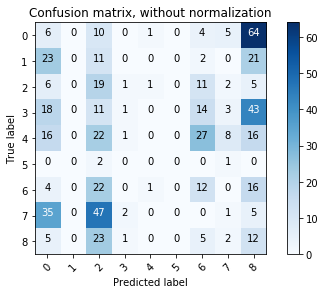

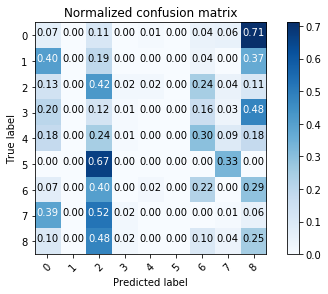

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

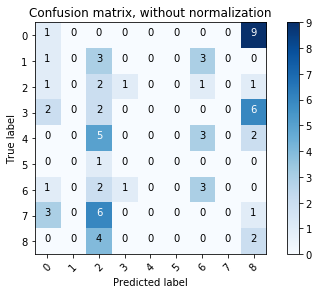

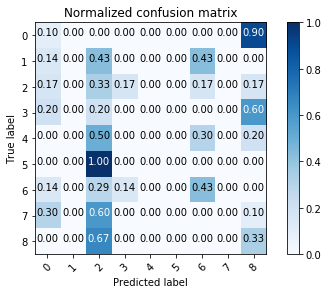



C = 12.5
kernel = sigmoid
degree = 6
             precision    recall  f1-score   support

          0       0.72      0.56      0.63        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.93      0.89      0.91        90
          4       0.28      0.99      0.44        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.97      0.64      0.77        90
          8       0.00      0.00      0.00        48

avg / total       0.56      0.55      0.51       568

accuracy: 0.5528169014084507
 0.56 0.55 0.51
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.23      1.00      0.38        10
          5

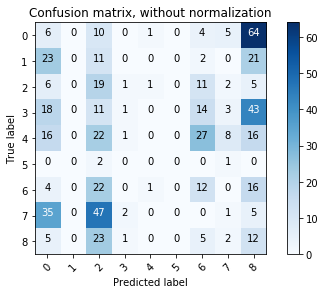

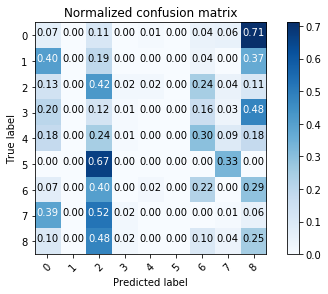

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

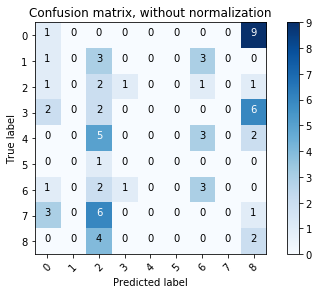

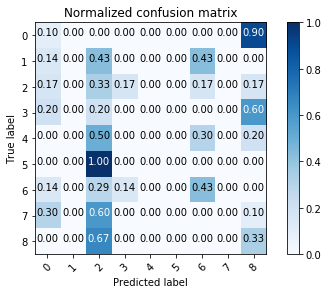



C = 12.5
kernel = sigmoid
degree = 10
             precision    recall  f1-score   support

          0       0.72      0.56      0.63        90
          1       0.97      0.65      0.78        57
          2       0.00      0.00      0.00        45
          3       0.93      0.89      0.91        90
          4       0.28      0.99      0.44        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.97      0.64      0.77        90
          8       0.00      0.00      0.00        48

avg / total       0.56      0.55      0.51       568

accuracy: 0.5528169014084507
 0.56 0.55 0.51
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       1.00      0.43      0.60         7
          2       0.00      0.00      0.00         6
          3       1.00      0.60      0.75        10
          4       0.23      1.00      0.38        10
          

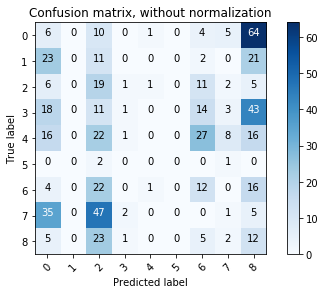

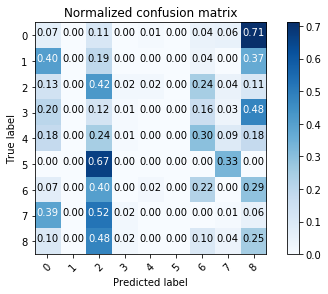

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

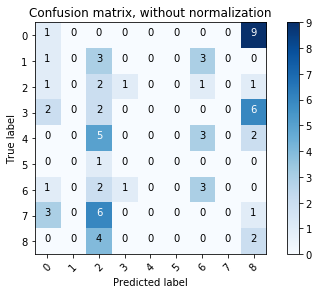

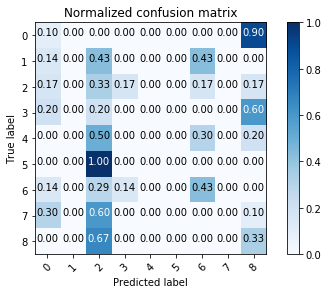



C = 100
kernel = rbf
degree = 2
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5     

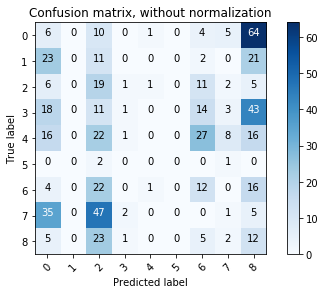

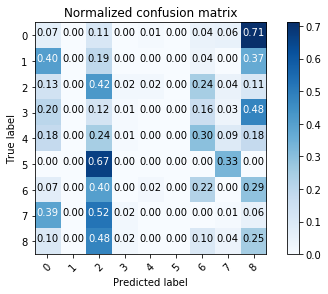

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

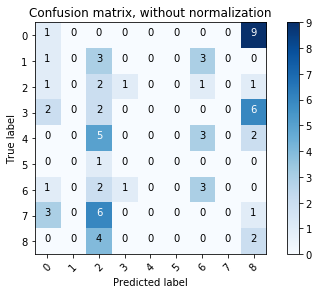

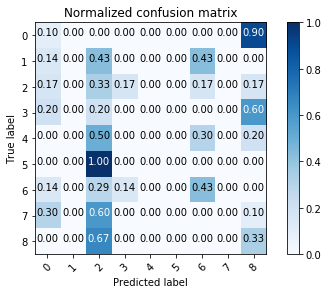



C = 100
kernel = rbf
degree = 4
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5     

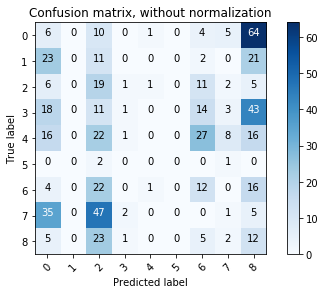

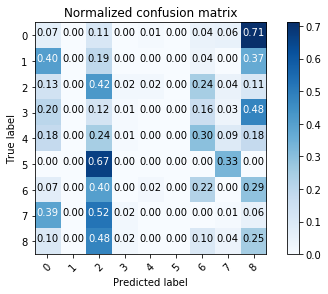

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

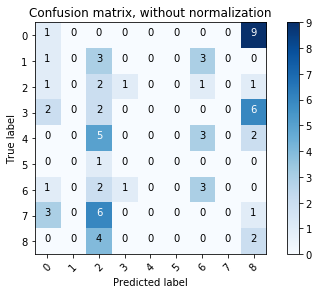

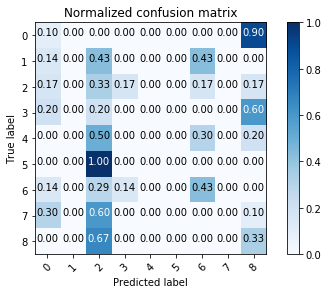



C = 100
kernel = rbf
degree = 5
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5     

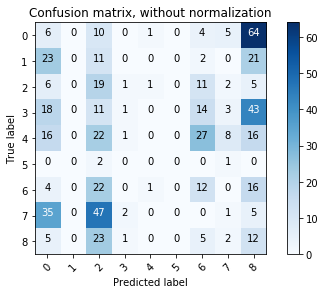

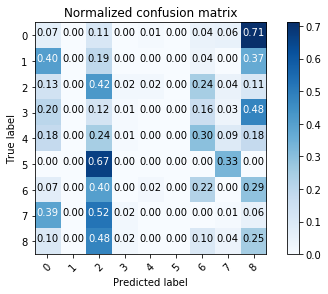

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

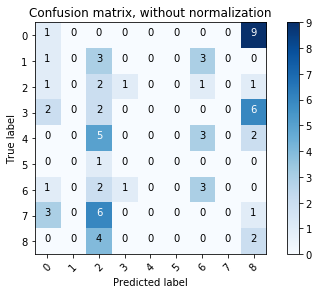

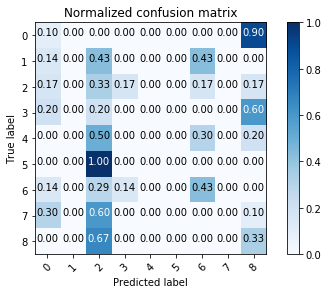



C = 100
kernel = rbf
degree = 6
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5     

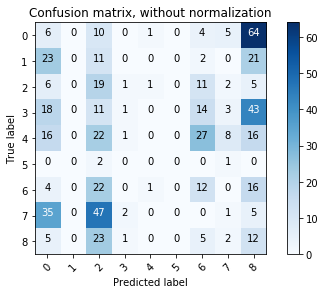

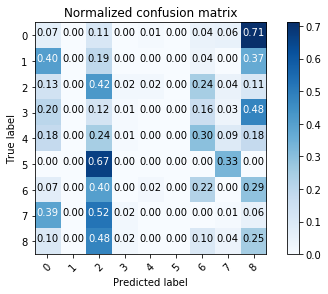

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

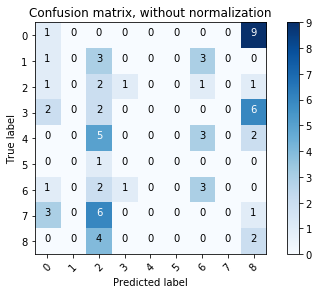

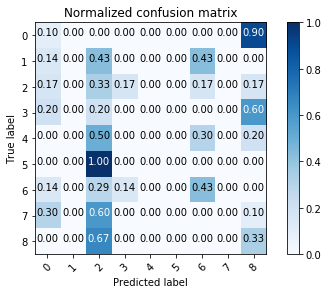



C = 100
kernel = rbf
degree = 10
             precision    recall  f1-score   support

          0       0.87      0.79      0.83        90
          1       0.98      0.81      0.88        57
          2       0.85      0.64      0.73        45
          3       0.99      0.97      0.98        90
          4       0.79      0.84      0.82        90
          5       0.00      0.00      0.00         3
          6       0.94      0.58      0.72        55
          7       0.56      0.99      0.71        90
          8       0.89      0.50      0.64        48

avg / total       0.84      0.80      0.80       568

accuracy: 0.7992957746478874
 0.84 0.80 0.80
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       1.00      0.70      0.82        10
          4       0.90      0.90      0.90        10
          5    

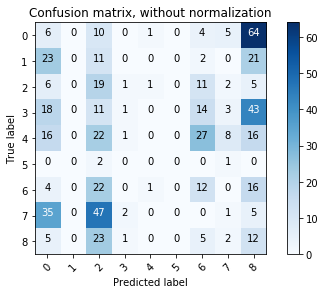

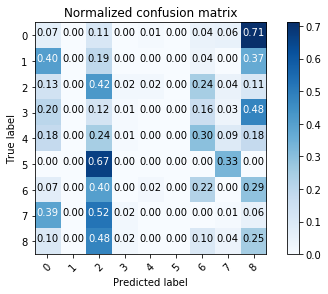

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

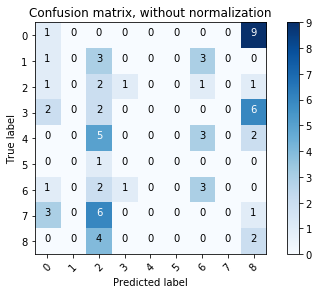

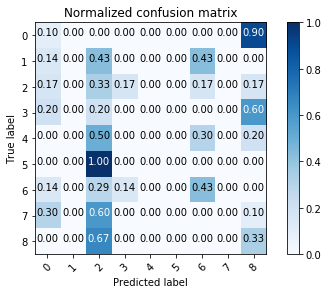



C = 100
kernel = linear
degree = 2
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

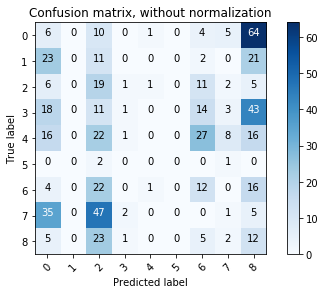

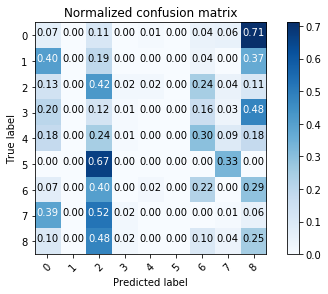

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

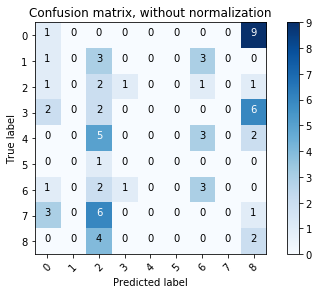

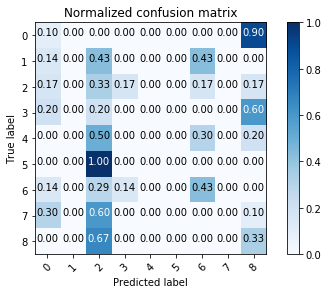



C = 100
kernel = linear
degree = 4
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

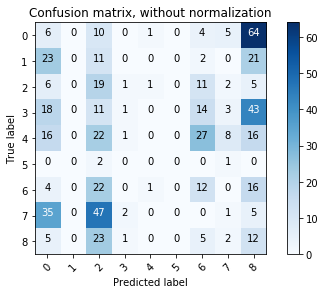

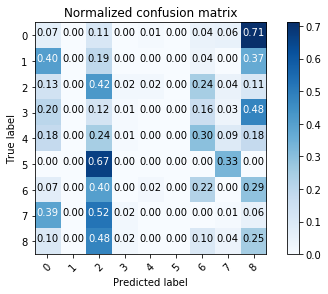

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

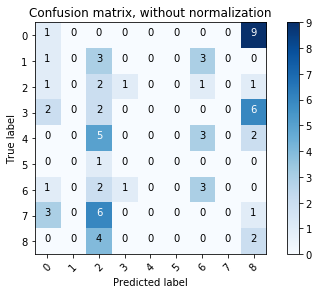

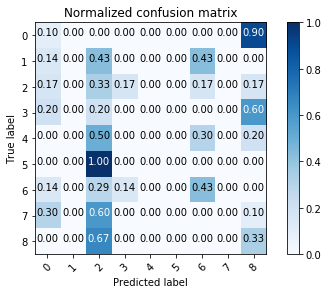



C = 100
kernel = linear
degree = 5
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

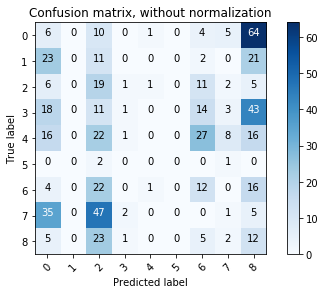

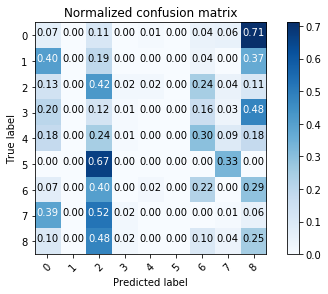

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

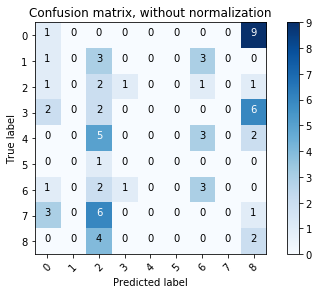

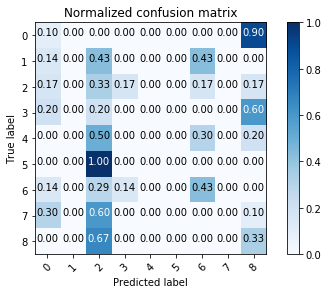



C = 100
kernel = linear
degree = 6
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

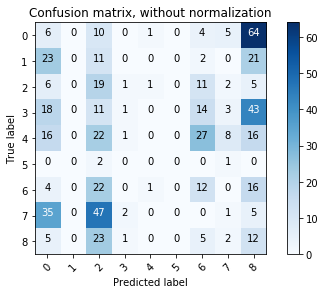

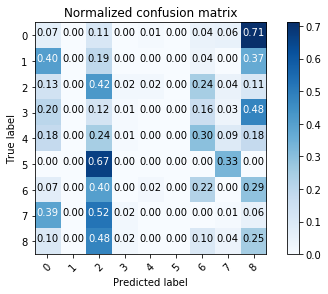

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

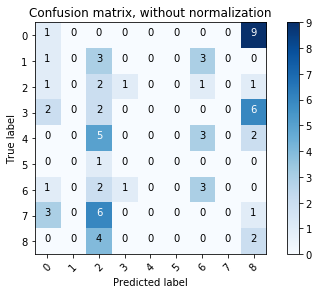

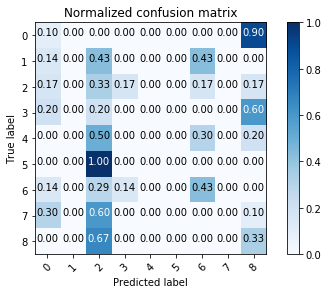



C = 100
kernel = linear
degree = 10
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5 

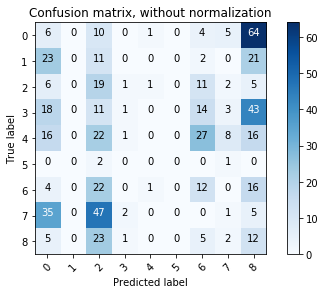

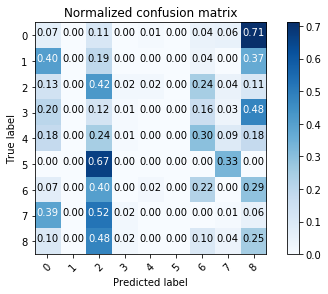

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

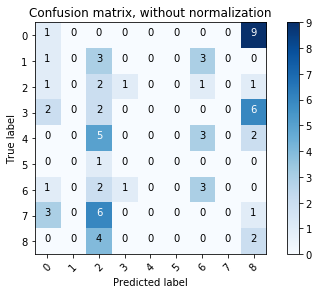

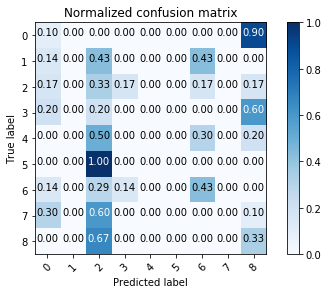



C = 100
kernel = poly
degree = 2
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.72      0.84        90
          4       0.23      1.00      0.37        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.98      0.59      0.74        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.44      0.41       568

accuracy: 0.44190140845070425
 0.49 0.44 0.41
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

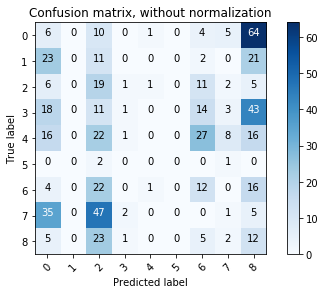

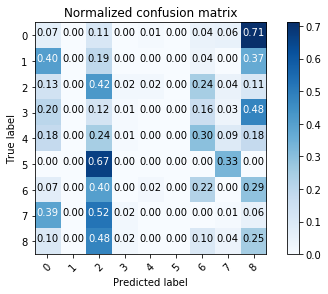

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

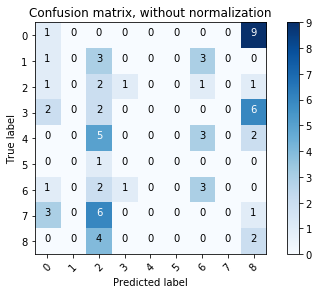

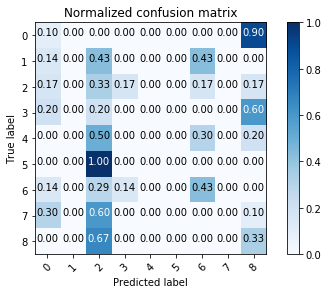



C = 100
kernel = poly
degree = 4
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.56      0.71        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4137323943661972
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

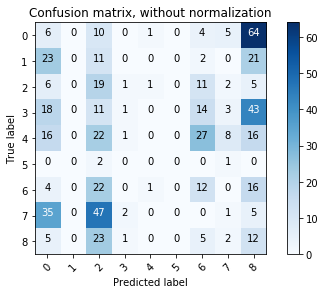

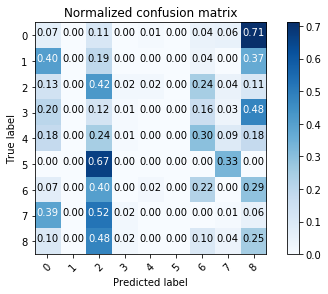

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

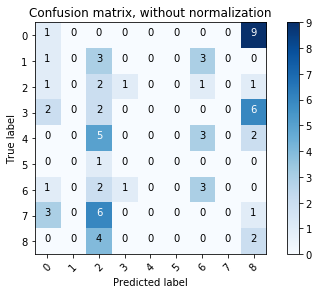

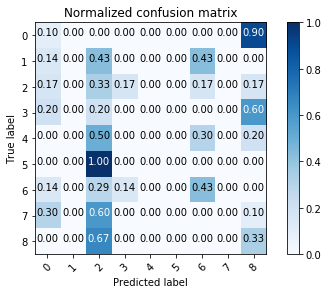



C = 100
kernel = poly
degree = 5
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

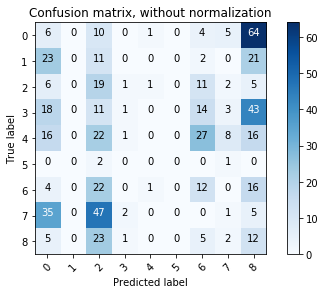

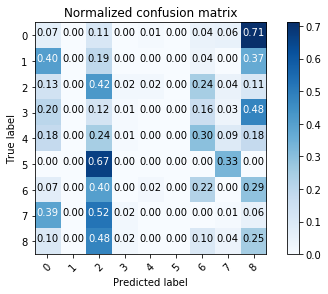

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

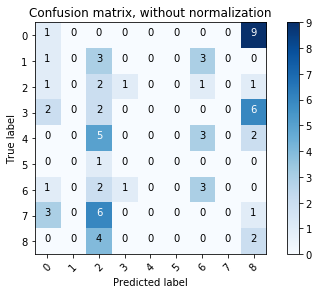

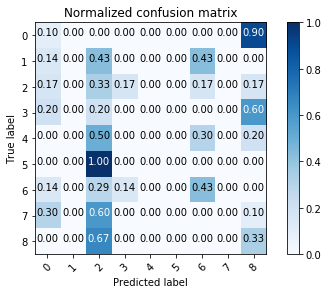



C = 100
kernel = poly
degree = 6
             precision    recall  f1-score   support

          0       0.88      0.47      0.61        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.59      0.74        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

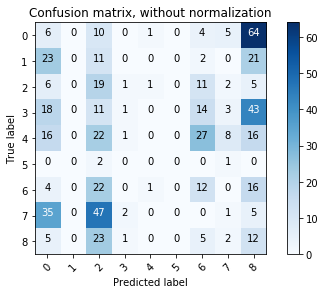

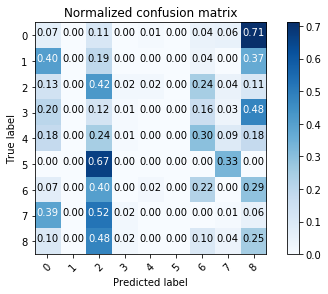

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

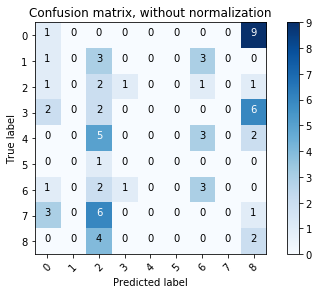

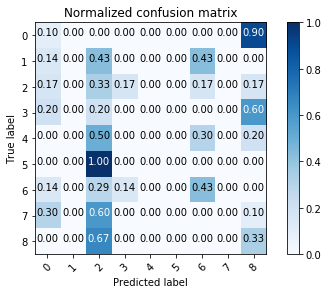



C = 100
kernel = poly
degree = 10
             precision    recall  f1-score   support

          0       0.55      0.90      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.85      0.98      0.91        90
          4       0.53      0.90      0.67        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.54      0.99      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.39      0.60      0.47       568

accuracy: 0.596830985915493
 0.39 0.60 0.47
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       0.70      0.70      0.70        10
          4       0.36      0.80      0.50        10
          5    

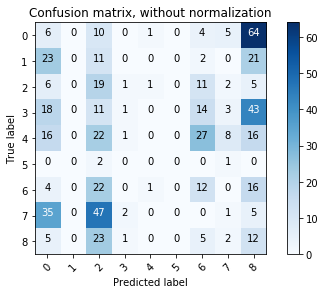

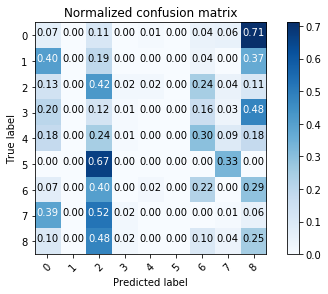

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

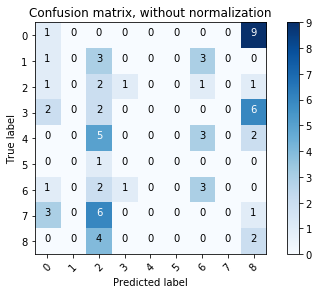

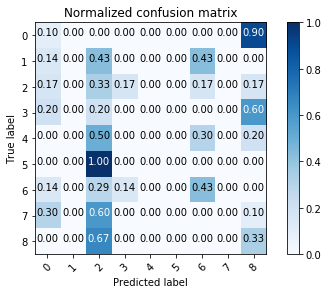



C = 100
kernel = sigmoid
degree = 2
             precision    recall  f1-score   support

          0       0.85      0.73      0.79        90
          1       0.98      0.75      0.85        57
          2       0.81      0.47      0.59        45
          3       0.98      0.97      0.97        90
          4       0.67      0.84      0.75        90
          5       0.00      0.00      0.00         3
          6       0.97      0.58      0.73        55
          7       0.55      0.99      0.70        90
          8       0.86      0.38      0.52        48

avg / total       0.81      0.76      0.75       568

accuracy: 0.7605633802816901
 0.81 0.76 0.75
             precision    recall  f1-score   support

          0       0.69      0.90      0.78        10
          1       1.00      0.43      0.60         7
          2       1.00      0.17      0.29         6
          3       1.00      0.70      0.82        10
          4       0.50      0.90      0.64        10
          5 

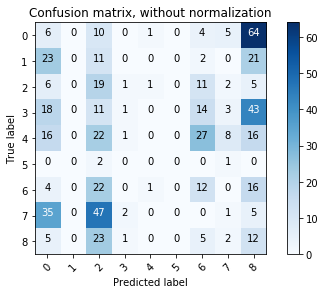

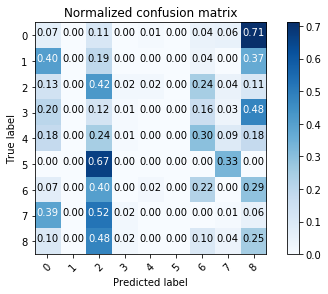

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

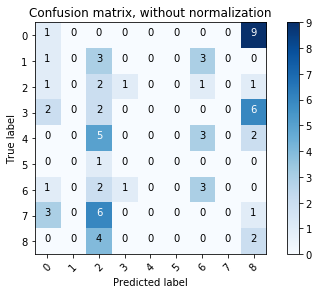

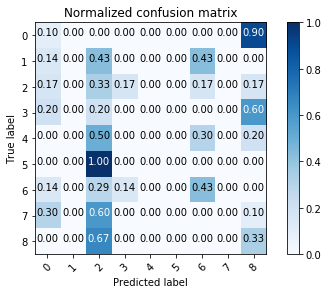



C = 100
kernel = sigmoid
degree = 4
             precision    recall  f1-score   support

          0       0.85      0.73      0.79        90
          1       0.98      0.75      0.85        57
          2       0.81      0.47      0.59        45
          3       0.98      0.97      0.97        90
          4       0.67      0.84      0.75        90
          5       0.00      0.00      0.00         3
          6       0.97      0.58      0.73        55
          7       0.55      0.99      0.70        90
          8       0.86      0.38      0.52        48

avg / total       0.81      0.76      0.75       568

accuracy: 0.7605633802816901
 0.81 0.76 0.75
             precision    recall  f1-score   support

          0       0.69      0.90      0.78        10
          1       1.00      0.43      0.60         7
          2       1.00      0.17      0.29         6
          3       1.00      0.70      0.82        10
          4       0.50      0.90      0.64        10
          5 

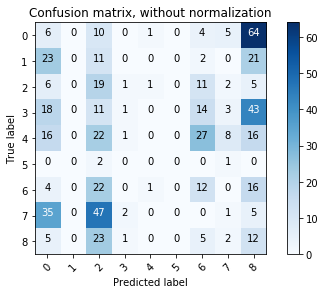

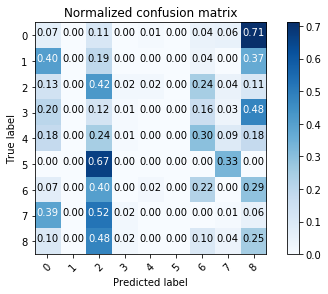

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

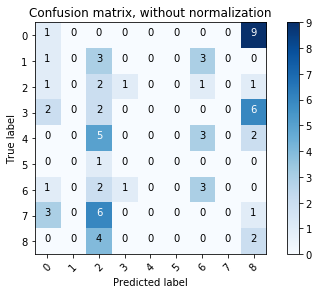

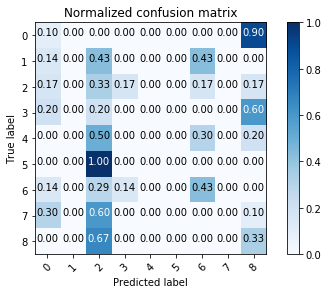



C = 100
kernel = sigmoid
degree = 5
             precision    recall  f1-score   support

          0       0.85      0.73      0.79        90
          1       0.98      0.75      0.85        57
          2       0.81      0.47      0.59        45
          3       0.98      0.97      0.97        90
          4       0.67      0.84      0.75        90
          5       0.00      0.00      0.00         3
          6       0.97      0.58      0.73        55
          7       0.55      0.99      0.70        90
          8       0.86      0.38      0.52        48

avg / total       0.81      0.76      0.75       568

accuracy: 0.7605633802816901
 0.81 0.76 0.75
             precision    recall  f1-score   support

          0       0.69      0.90      0.78        10
          1       1.00      0.43      0.60         7
          2       1.00      0.17      0.29         6
          3       1.00      0.70      0.82        10
          4       0.50      0.90      0.64        10
          5 

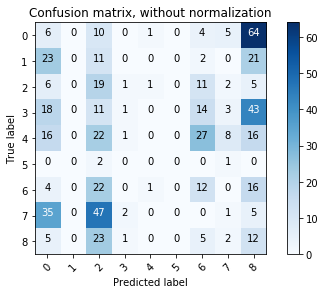

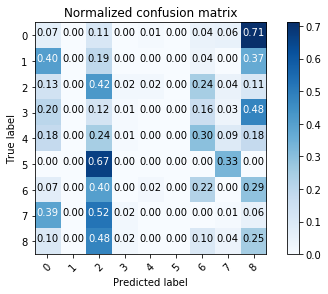

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

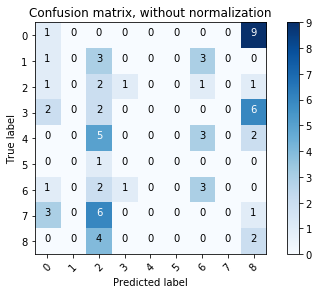

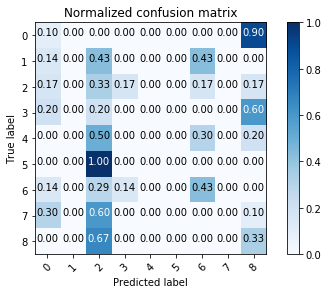



C = 100
kernel = sigmoid
degree = 6
             precision    recall  f1-score   support

          0       0.85      0.73      0.79        90
          1       0.98      0.75      0.85        57
          2       0.81      0.47      0.59        45
          3       0.98      0.97      0.97        90
          4       0.67      0.84      0.75        90
          5       0.00      0.00      0.00         3
          6       0.97      0.58      0.73        55
          7       0.55      0.99      0.70        90
          8       0.86      0.38      0.52        48

avg / total       0.81      0.76      0.75       568

accuracy: 0.7605633802816901
 0.81 0.76 0.75
             precision    recall  f1-score   support

          0       0.69      0.90      0.78        10
          1       1.00      0.43      0.60         7
          2       1.00      0.17      0.29         6
          3       1.00      0.70      0.82        10
          4       0.50      0.90      0.64        10
          5 

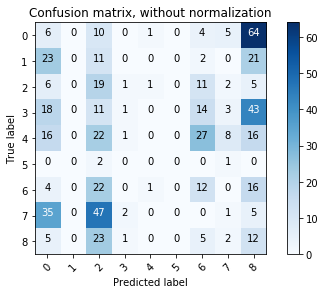

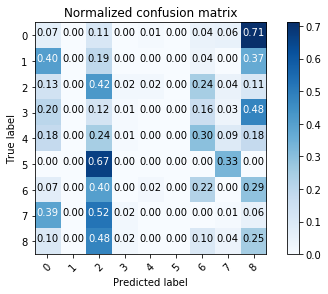

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

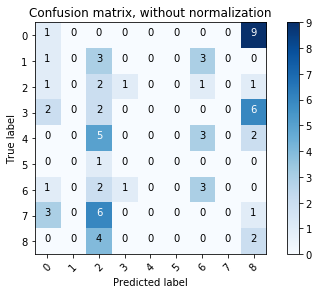

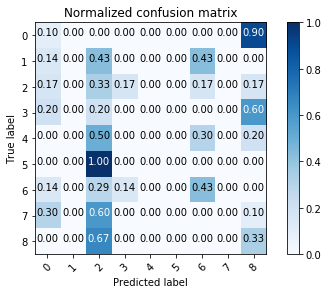



C = 100
kernel = sigmoid
degree = 10
             precision    recall  f1-score   support

          0       0.85      0.73      0.79        90
          1       0.98      0.75      0.85        57
          2       0.81      0.47      0.59        45
          3       0.98      0.97      0.97        90
          4       0.67      0.84      0.75        90
          5       0.00      0.00      0.00         3
          6       0.97      0.58      0.73        55
          7       0.55      0.99      0.70        90
          8       0.86      0.38      0.52        48

avg / total       0.81      0.76      0.75       568

accuracy: 0.7605633802816901
 0.81 0.76 0.75
             precision    recall  f1-score   support

          0       0.69      0.90      0.78        10
          1       1.00      0.43      0.60         7
          2       1.00      0.17      0.29         6
          3       1.00      0.70      0.82        10
          4       0.50      0.90      0.64        10
          5

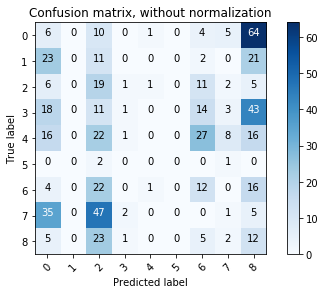

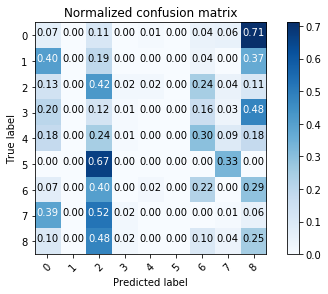

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

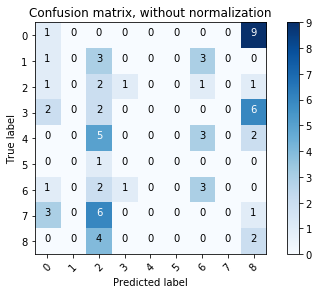

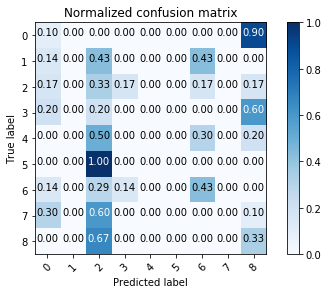



C = 500
kernel = rbf
degree = 2
             precision    recall  f1-score   support

          0       0.96      0.87      0.91        90
          1       0.98      0.84      0.91        57
          2       1.00      0.71      0.83        45
          3       1.00      0.98      0.99        90
          4       0.94      0.90      0.92        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.58      0.98      0.73        90
          8       0.95      0.79      0.86        48

avg / total       0.91      0.87      0.88       568

accuracy: 0.8679577464788732
 0.91 0.87 0.88
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.78      0.70      0.74        10
          5     

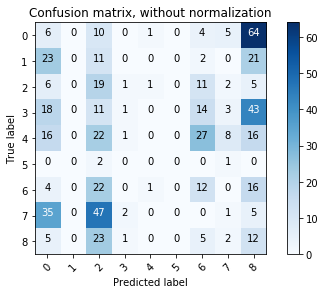

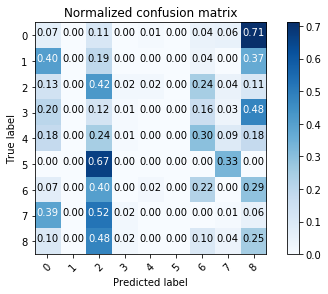

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

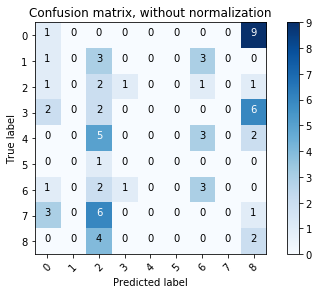

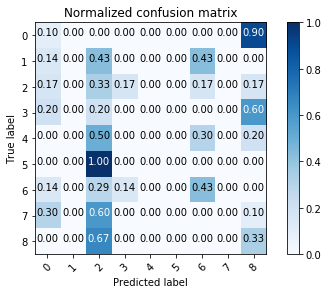



C = 500
kernel = rbf
degree = 4
             precision    recall  f1-score   support

          0       0.96      0.87      0.91        90
          1       0.98      0.84      0.91        57
          2       1.00      0.71      0.83        45
          3       1.00      0.98      0.99        90
          4       0.94      0.90      0.92        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.58      0.98      0.73        90
          8       0.95      0.79      0.86        48

avg / total       0.91      0.87      0.88       568

accuracy: 0.8679577464788732
 0.91 0.87 0.88
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.78      0.70      0.74        10
          5     

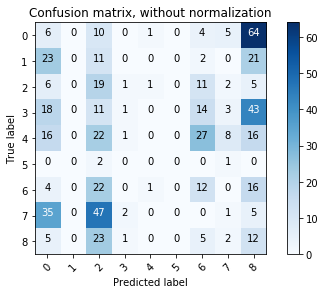

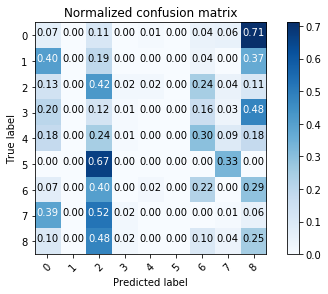

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

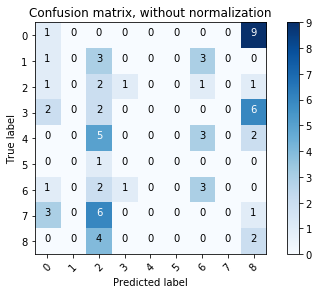

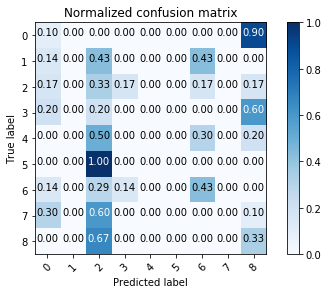



C = 500
kernel = rbf
degree = 5
             precision    recall  f1-score   support

          0       0.96      0.87      0.91        90
          1       0.98      0.84      0.91        57
          2       1.00      0.71      0.83        45
          3       1.00      0.98      0.99        90
          4       0.94      0.90      0.92        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.58      0.98      0.73        90
          8       0.95      0.79      0.86        48

avg / total       0.91      0.87      0.88       568

accuracy: 0.8679577464788732
 0.91 0.87 0.88
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.78      0.70      0.74        10
          5     

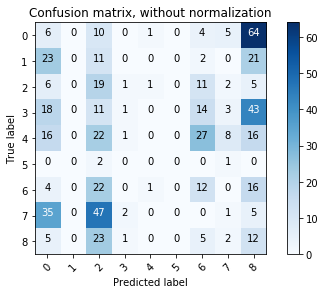

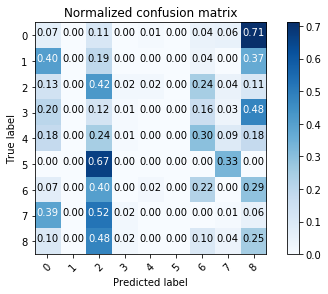

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

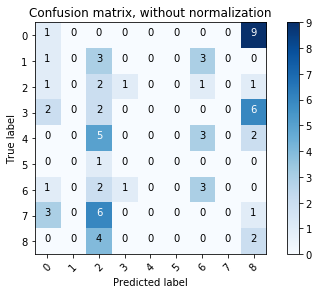

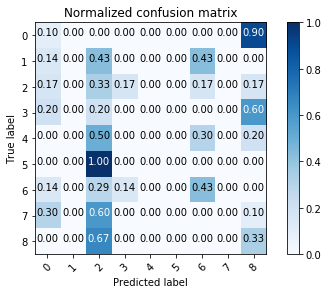



C = 500
kernel = rbf
degree = 6
             precision    recall  f1-score   support

          0       0.96      0.87      0.91        90
          1       0.98      0.84      0.91        57
          2       1.00      0.71      0.83        45
          3       1.00      0.98      0.99        90
          4       0.94      0.90      0.92        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.58      0.98      0.73        90
          8       0.95      0.79      0.86        48

avg / total       0.91      0.87      0.88       568

accuracy: 0.8679577464788732
 0.91 0.87 0.88
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.78      0.70      0.74        10
          5     

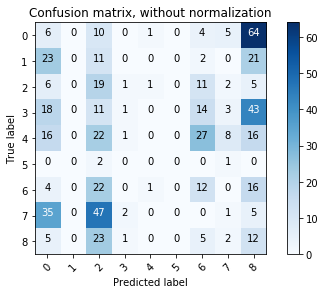

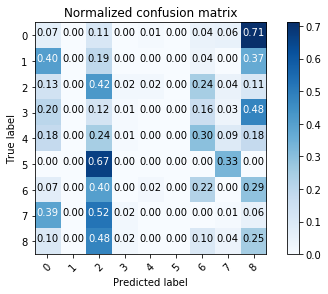

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

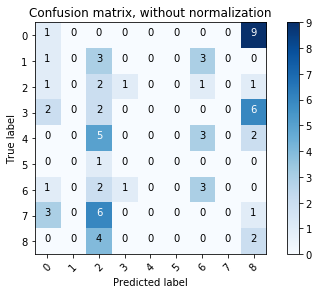

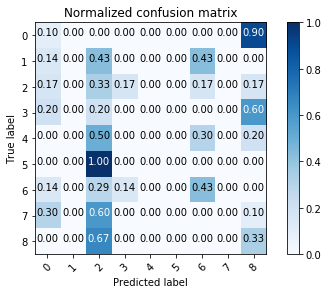



C = 500
kernel = rbf
degree = 10
             precision    recall  f1-score   support

          0       0.96      0.87      0.91        90
          1       0.98      0.84      0.91        57
          2       1.00      0.71      0.83        45
          3       1.00      0.98      0.99        90
          4       0.94      0.90      0.92        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.58      0.98      0.73        90
          8       0.95      0.79      0.86        48

avg / total       0.91      0.87      0.88       568

accuracy: 0.8679577464788732
 0.91 0.87 0.88
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.78      0.70      0.74        10
          5    

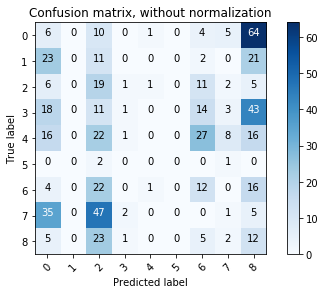

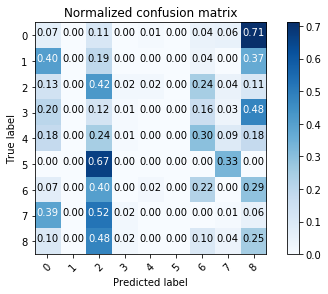

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

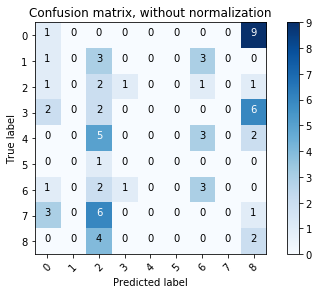

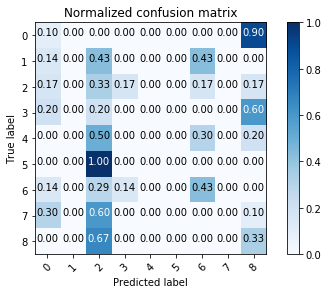



C = 500
kernel = linear
degree = 2
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

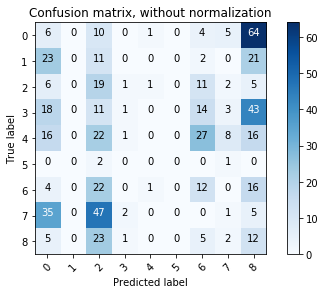

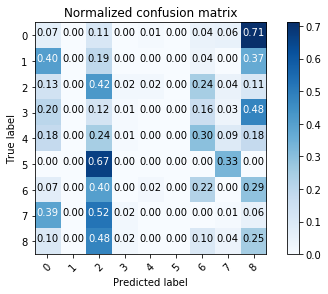

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

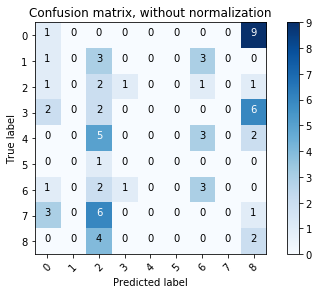

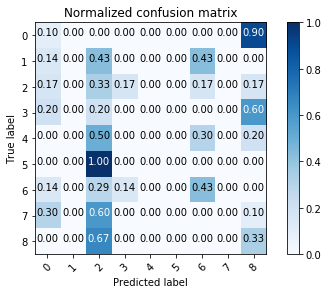



C = 500
kernel = linear
degree = 4
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

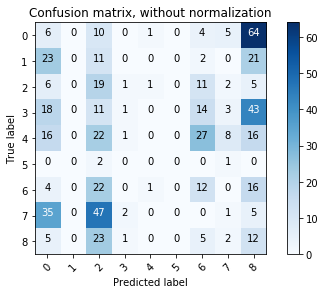

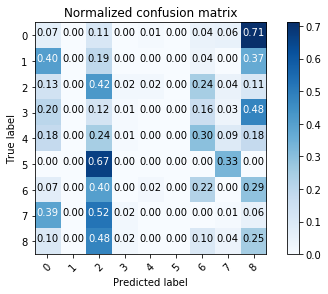

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

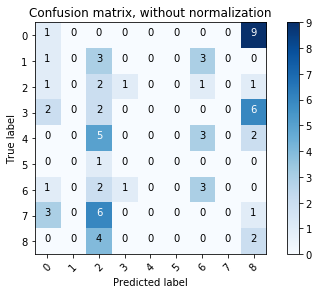

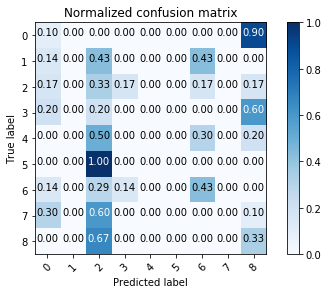



C = 500
kernel = linear
degree = 5
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

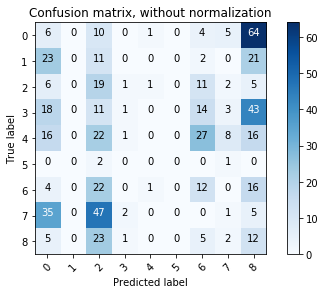

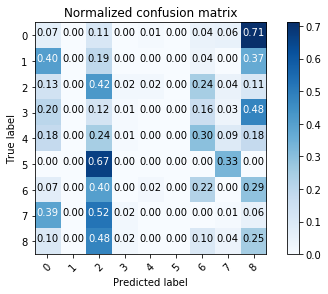

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

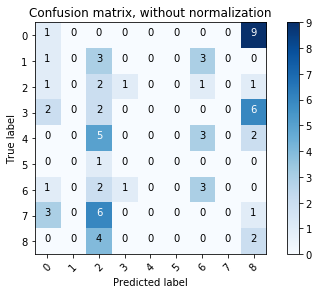

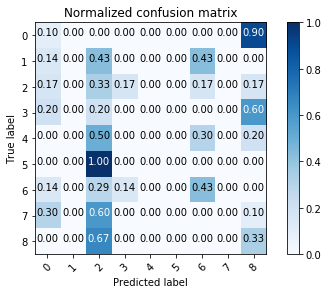



C = 500
kernel = linear
degree = 6
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5  

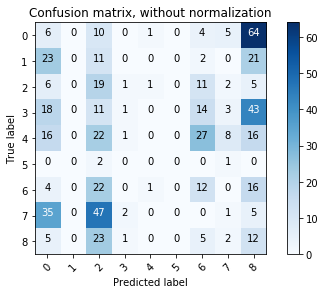

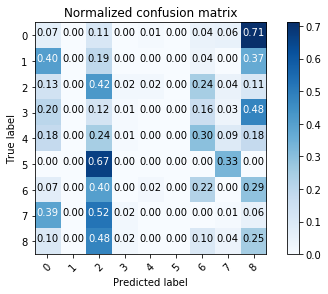

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

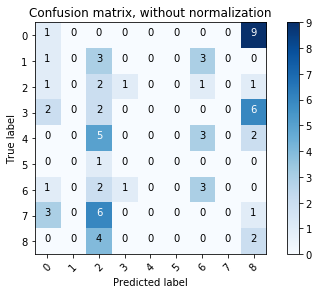

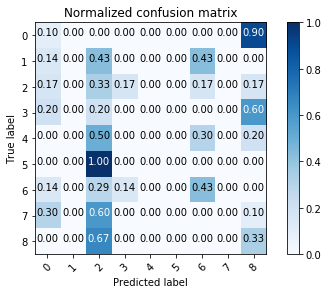



C = 500
kernel = linear
degree = 10
             precision    recall  f1-score   support

          0       1.00      0.90      0.95        90
          1       1.00      0.84      0.91        57
          2       1.00      0.73      0.85        45
          3       1.00      0.98      0.99        90
          4       0.98      0.90      0.94        90
          5       1.00      0.33      0.50         3
          6       1.00      0.71      0.83        55
          7       0.59      0.99      0.74        90
          8       1.00      0.90      0.95        48

avg / total       0.93      0.89      0.89       568

accuracy: 0.8855633802816901
 0.93 0.89 0.89
             precision    recall  f1-score   support

          0       0.77      1.00      0.87        10
          1       1.00      0.43      0.60         7
          2       1.00      0.33      0.50         6
          3       0.78      0.70      0.74        10
          4       0.70      0.70      0.70        10
          5 

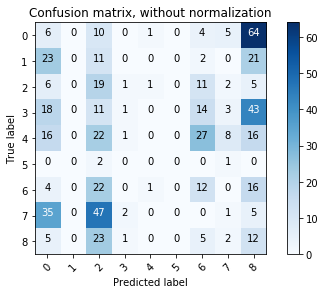

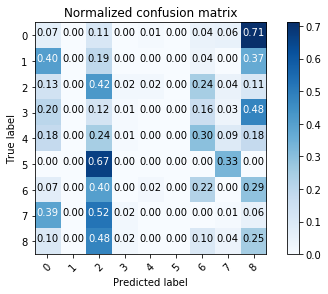

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

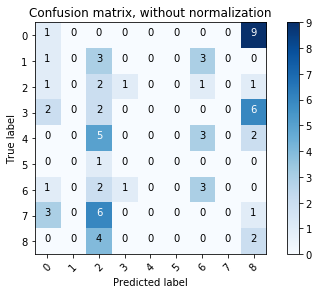

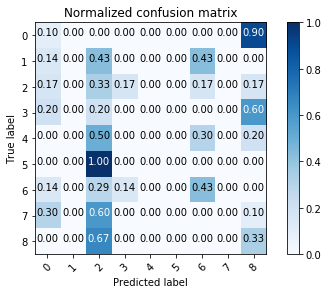



C = 500
kernel = poly
degree = 2
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.72      0.84        90
          4       0.23      1.00      0.37        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.98      0.59      0.74        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.44      0.41       568

accuracy: 0.44190140845070425
 0.49 0.44 0.41
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5   

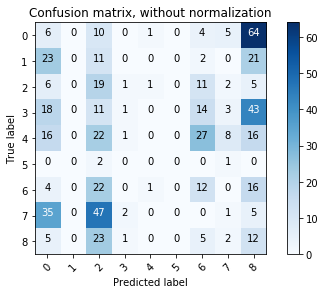

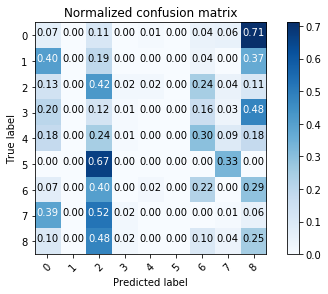

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

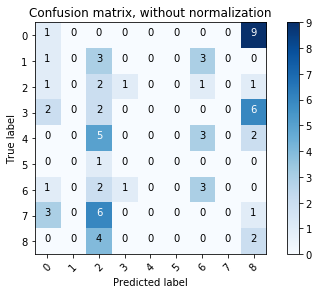

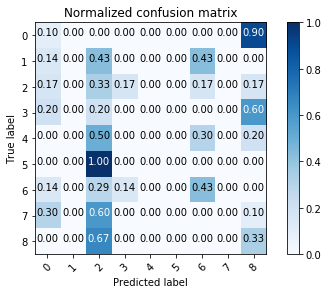



C = 500
kernel = poly
degree = 4
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.22      1.00      0.36        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.56      0.71        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4137323943661972
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

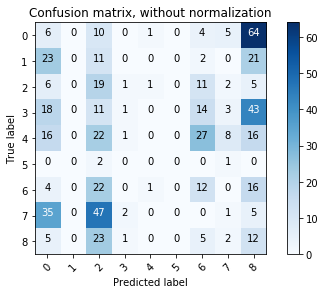

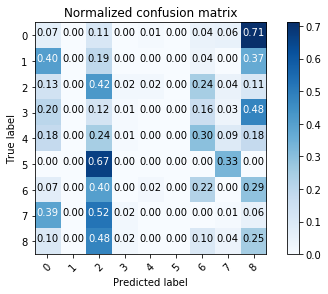

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

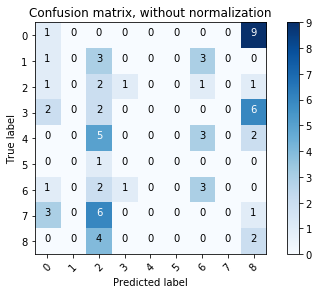

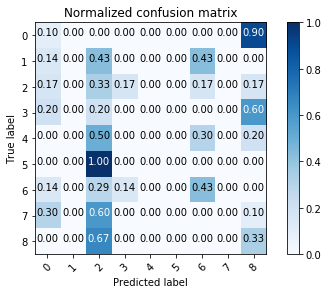



C = 500
kernel = poly
degree = 5
             precision    recall  f1-score   support

          0       0.88      0.48      0.62        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.58      0.73        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

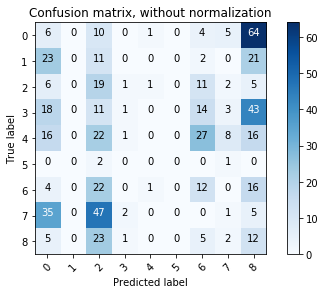

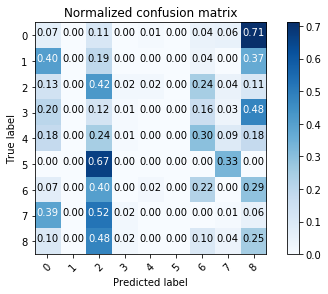

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

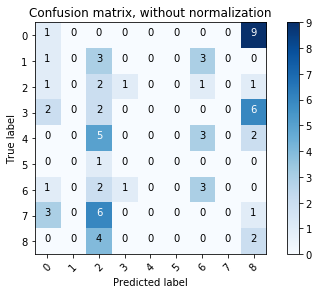

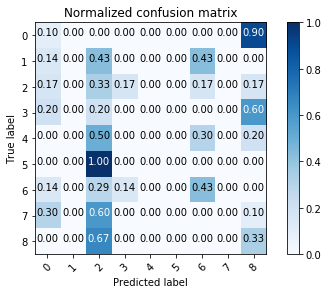



C = 500
kernel = poly
degree = 6
             precision    recall  f1-score   support

          0       0.88      0.47      0.61        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       1.00      0.59      0.74        90
          4       0.21      1.00      0.35        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       1.00      0.53      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.49      0.41      0.38       568

accuracy: 0.4102112676056338
 0.49 0.41 0.38
             precision    recall  f1-score   support

          0       0.80      0.80      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       1.00      0.40      0.57        10
          4       0.20      1.00      0.33        10
          5    

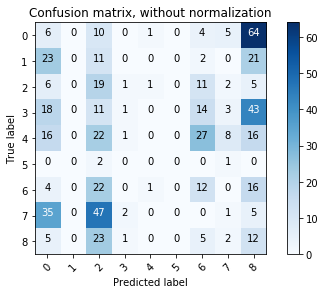

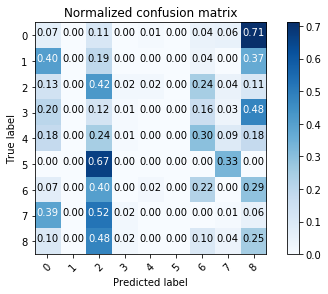

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

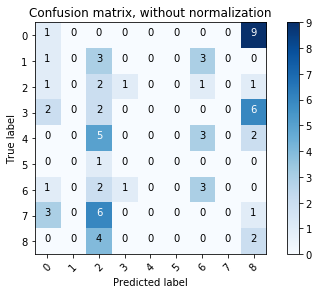

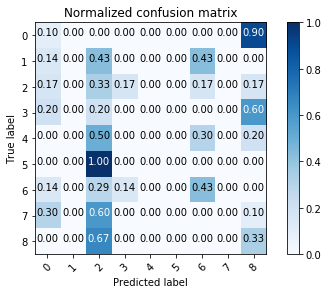



C = 500
kernel = poly
degree = 10
             precision    recall  f1-score   support

          0       0.55      0.90      0.68        90
          1       0.00      0.00      0.00        57
          2       0.00      0.00      0.00        45
          3       0.85      0.98      0.91        90
          4       0.53      0.90      0.67        90
          5       0.00      0.00      0.00         3
          6       0.00      0.00      0.00        55
          7       0.54      0.99      0.70        90
          8       0.00      0.00      0.00        48

avg / total       0.39      0.60      0.47       568

accuracy: 0.596830985915493
 0.39 0.60 0.47
             precision    recall  f1-score   support

          0       0.67      1.00      0.80        10
          1       0.00      0.00      0.00         7
          2       0.00      0.00      0.00         6
          3       0.70      0.70      0.70        10
          4       0.36      0.80      0.50        10
          5    

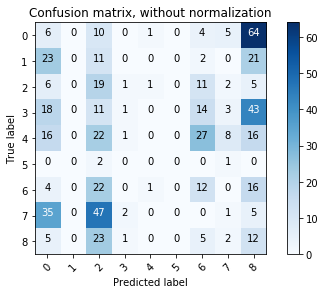

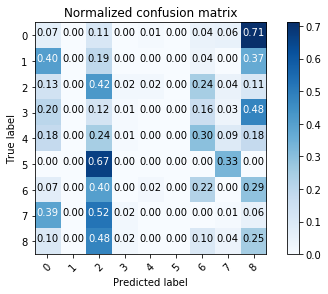

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

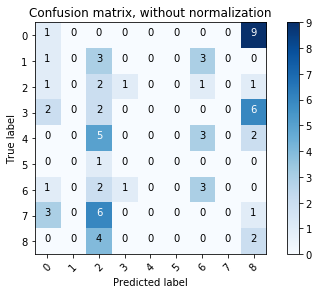

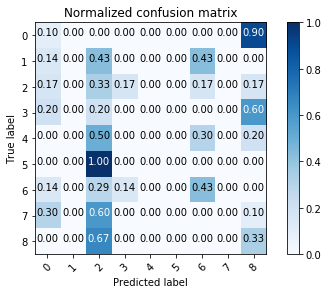



C = 500
kernel = sigmoid
degree = 2
             precision    recall  f1-score   support

          0       0.88      0.83      0.86        90
          1       0.98      0.81      0.88        57
          2       0.86      0.67      0.75        45
          3       1.00      0.98      0.99        90
          4       0.89      0.88      0.88        90
          5       1.00      0.33      0.50         3
          6       1.00      0.64      0.78        55
          7       0.58      0.97      0.72        90
          8       0.89      0.69      0.78        48

avg / total       0.87      0.83      0.84       568

accuracy: 0.8345070422535211
 0.87 0.83 0.84
             precision    recall  f1-score   support

          0       0.64      0.90      0.75        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.89      0.80      0.84        10
          5 

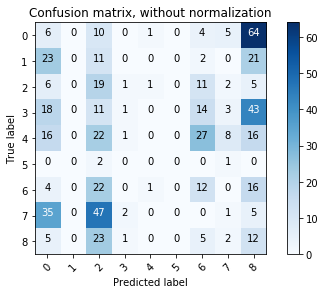

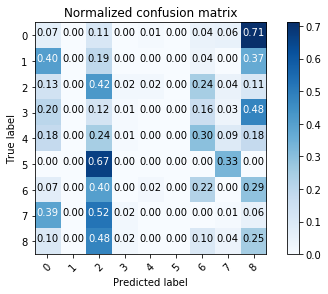

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

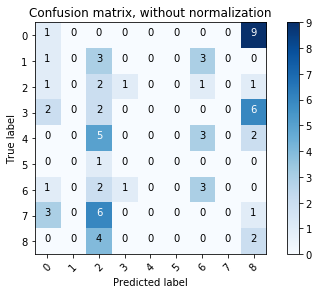

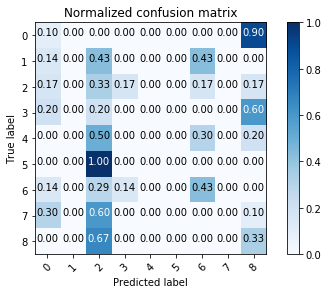



C = 500
kernel = sigmoid
degree = 4
             precision    recall  f1-score   support

          0       0.88      0.83      0.86        90
          1       0.98      0.81      0.88        57
          2       0.86      0.67      0.75        45
          3       1.00      0.98      0.99        90
          4       0.89      0.88      0.88        90
          5       1.00      0.33      0.50         3
          6       1.00      0.64      0.78        55
          7       0.58      0.97      0.72        90
          8       0.89      0.69      0.78        48

avg / total       0.87      0.83      0.84       568

accuracy: 0.8345070422535211
 0.87 0.83 0.84
             precision    recall  f1-score   support

          0       0.64      0.90      0.75        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.89      0.80      0.84        10
          5 

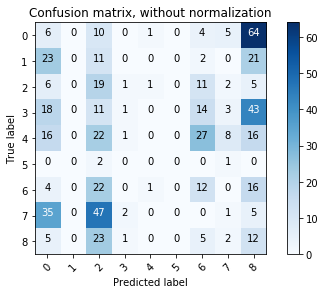

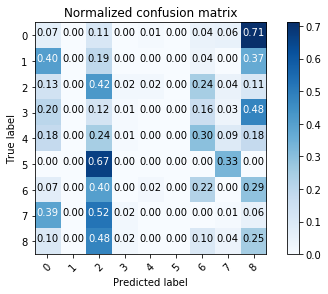

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

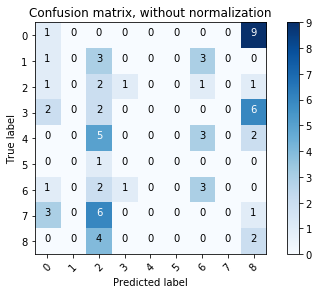

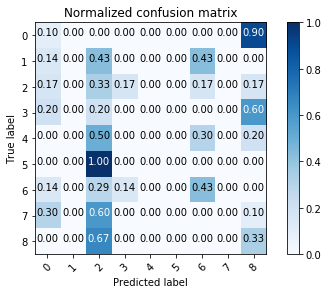



C = 500
kernel = sigmoid
degree = 5
             precision    recall  f1-score   support

          0       0.88      0.83      0.86        90
          1       0.98      0.81      0.88        57
          2       0.86      0.67      0.75        45
          3       1.00      0.98      0.99        90
          4       0.89      0.88      0.88        90
          5       1.00      0.33      0.50         3
          6       1.00      0.64      0.78        55
          7       0.58      0.97      0.72        90
          8       0.89      0.69      0.78        48

avg / total       0.87      0.83      0.84       568

accuracy: 0.8345070422535211
 0.87 0.83 0.84
             precision    recall  f1-score   support

          0       0.64      0.90      0.75        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.89      0.80      0.84        10
          5 

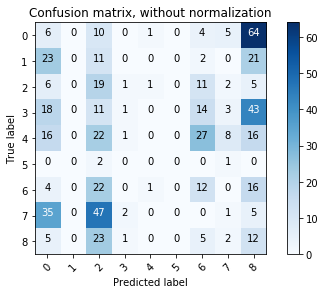

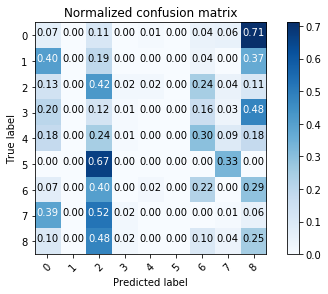

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

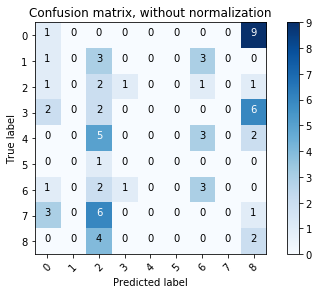

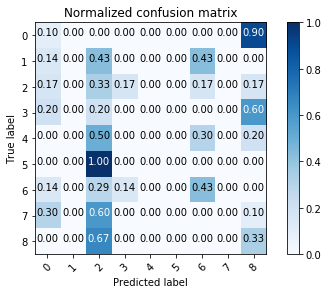



C = 500
kernel = sigmoid
degree = 6
             precision    recall  f1-score   support

          0       0.88      0.83      0.86        90
          1       0.98      0.81      0.88        57
          2       0.86      0.67      0.75        45
          3       1.00      0.98      0.99        90
          4       0.89      0.88      0.88        90
          5       1.00      0.33      0.50         3
          6       1.00      0.64      0.78        55
          7       0.58      0.97      0.72        90
          8       0.89      0.69      0.78        48

avg / total       0.87      0.83      0.84       568

accuracy: 0.8345070422535211
 0.87 0.83 0.84
             precision    recall  f1-score   support

          0       0.64      0.90      0.75        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.89      0.80      0.84        10
          5 

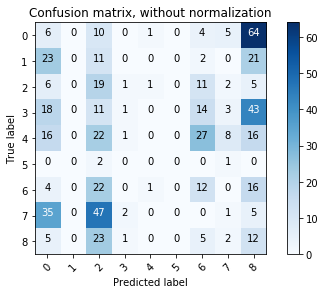

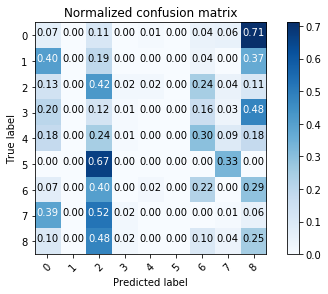

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

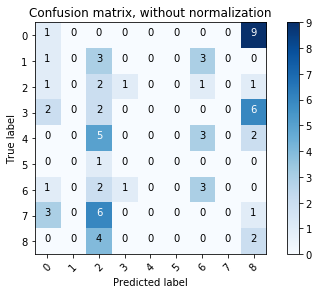

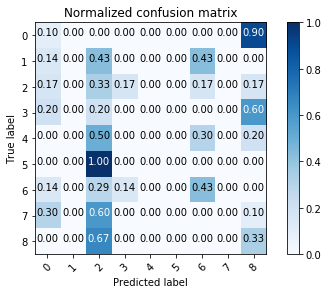



C = 500
kernel = sigmoid
degree = 10
             precision    recall  f1-score   support

          0       0.88      0.83      0.86        90
          1       0.98      0.81      0.88        57
          2       0.86      0.67      0.75        45
          3       1.00      0.98      0.99        90
          4       0.89      0.88      0.88        90
          5       1.00      0.33      0.50         3
          6       1.00      0.64      0.78        55
          7       0.58      0.97      0.72        90
          8       0.89      0.69      0.78        48

avg / total       0.87      0.83      0.84       568

accuracy: 0.8345070422535211
 0.87 0.83 0.84
             precision    recall  f1-score   support

          0       0.64      0.90      0.75        10
          1       1.00      0.43      0.60         7
          2       0.67      0.33      0.44         6
          3       0.78      0.70      0.74        10
          4       0.89      0.80      0.84        10
          5

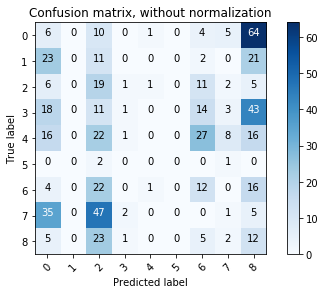

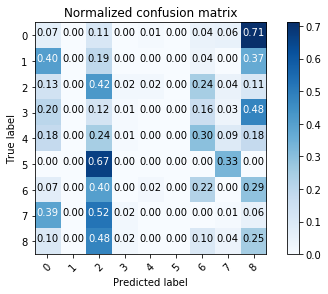

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[1 0 0 0 0 0 0 0 9]
 [1 0 3 0 0 0 3 0 0]
 [1 0 2 1 0 0 1 0 1]
 [2 0 2 0 0 0 0 0 6]
 [0 0 5 0 0 0 3 0 2]
 [0 0 1 0 0 0 0 0 0]
 [1 0 2 1 0 0 3 0 0]
 [3 0 6 0 0 0 0 0 1]
 [0 0 4 0 0 0 0 0 2]]
Normalized confusion matrix
[[0.1        0.         0.         0.         0.         0.
  0.         0.         0.9       ]
 [0.14285714 0.         0.42857143 0.         0.         0.
  0.42857143 0.         0.        ]
 [0.16666667 0.         0.33333333 0.16666667 0.         0.
  0.16666667 0.         0.16666667]
 [0.2        0.         0.2        0.         0.         0.
  0.         0.         0.6       ]
 [0.         0.         0.5        0.         0.         0.
  0.3        0.         0.2       ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.        ]
 [0.14285714 0.         0.28571429 0.14285714 0.         0.
  0.42857143 0.         0.        ]
 [0.3        0.         0.6        0.         0.

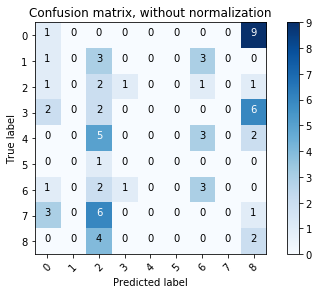

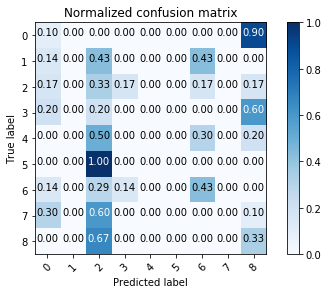

In [241]:
for C in [1.0, 0.2, 12.5, 100, 500]:
    for kernel in ['rbf', 'linear', 'poly', 'sigmoid']:
        for degree in [2, 4, 5, 6, 10]:
            print("")
            print("")
            print("C =", C)
            print("kernel =", kernel)
            print("degree =", degree)
            parameters_df, results_df = run_classification_and_write_results(X_train, y_train, X_test, y_test, 
                                                                 parameters_df, results_df,
                                                                 categories_count=9, max_elements_in_category=100, 
                                                                 C=C, kernel=kernel, degree=degree)